# Xinwenlianbo and FTSE China A50 Stock Return Direction Prediction



**Author:** *Wong, Yat Chun*

**Date:** Jun 17, 2019



## Abstract

This project is an attempt to construct a framework to predict the FTSE China A50 Index components by incorporating the text data of Xinwenlianbo (新闻联播) alongside with other common technical features such as rolling means and volatility. I extract a number of features from the text, such as sentiment score, keywords, tag, month, quarter, day of weeks, etc. A piece of text is said to be relevant to a specific company if the text contains any keywords of that company. I find most, if not all, of the features generated by the relevant text are discarded during the feature selection process. It shows that the these features have little correlations with the future returns in an observation window of 1, 5, 10, and 20 trading days, respectively. Moreover, based on the features selected for each stock, I perform simple linear regression, extra trees, and an ensemble learning technique by combining the predictions made by the previous 2 base models to predict the directions of future returns of each stock. However, by constructing a long-short delta-neutral based on these models, investors might still be able to earn a decent profit margin albeit these profits are hardly attributable to the text itself as the models usually do not contain text features.


In [1]:
from IPython.display import HTML
import warnings
warnings.simplefilter("ignore")

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

## 1. Motivation and Scope of the Project

### 1.1. Motivation

No one can deny that China stock market is highly policy-oriented, so are Chinese investors. That's why there might be some occasional abnormal phenonena in Chinese stock market because investors might sense the investment opportunites based on government actions or official statements. Xinwenlianbo (新闻联播), in particular, is an offical channel for government to convey their messages to the public. Many people believe by carefully interpreting these messages, they can get the "tips" from the government. Therefore, by analysing the news of Xinwenlianbo, we might be able to guess the market behaviours of the investors, and therefore, the returns of some stocks.

### 1.2. The Scope of the Projecct

The scope of this project is limited to predicting the directions of the stock returns using the established Chinese NLP tools and building a simple long-short dollar-neutral strategy to test the potential profitability of the models. Therefore, this project will not discuss the details of natural language processing of Chinese language, the in-depth details of the machine learning algorithms, or the detail implementation of the trading strategies based on the prediction models. Any of these topics can be an future extension of this work. 

## 2. Source of Data

The Xinwenlianbo text raw data and the stock close prices of the FTSE China A50 components are provided by an open-source data platform called *Tushare*. *Tushare* generously gives me and other university students a free access to its comprehensive and high-quality database for academic research. This project would not succeed without the help of *Tushare*. 


## 2.1 Xinwenlianbo Data

I extract the text data for Xinwenlianbo from 2013-01-01 to 2018-12-31. Here is an example:

In [2]:
import pandas as pd
import numpy as np

In [3]:
xwlbText = pd.read_csv('news_clean.csv')
xwlbText[['date', 'title', 'content']].head()

,date,title,content
0,2013-01-01,经济温和回升态势基本确立,今天，中国物流与采购联合会公布的2012年12月份制造业采购经理指数为50.6%，同上月持平...
1,2013-01-01,世界各地喜迎2013年,在2012年和2013年的更替之际，世界多地都举办了辞旧迎新活动。人们在这一刻互致祝福，对2...
2,2013-01-01,大庆油田实现连续十年原油稳产,截至2012年12月31日，大庆油田全年生产原油4000万吨、天然气33亿立方米。大庆油田连...
3,2013-01-01,【央视新年述评之二】中国梦：共享明天丰盈民生,今天是元旦，2013年第一个小长假开始了，您打算跟谁一起过节呢？就在几天前，全国人大常委会表...
4,2013-01-01,元旦一批新法新规开始实施,随着2013年的到来，我国一批与百姓生活密切相关的新法新规也开始正式实施。新修改刑诉法明确非...


More specifically, the title of a piece of text on 2013-04-13 is:

In [4]:
print(xwlbText[xwlbText['date'] == '2013-04-13'].iloc[1].title)

美发布《国际经济和汇率政策报告》


And the the content of this piece of text:

In [5]:
print(xwlbText[xwlbText['date'] == '2013-04-13'].iloc[1].content)

美国财政部12号公布了针对主要贸易对象的《国际经济和汇率政策报告》。报告认为，包括中国在内的美国主要贸易伙伴并未操纵货币汇率以获取不公平贸易优势，同时警告日本不要采取日元“竞争性贬值”政策。美国财政部表示，将密切关注日本当局为刺激国内经济需求而采取的大规模资产购买货币政策，日本不应采取针对别国的日元“竞争性贬值”政策；在2012年下半年，美元对主要贸易伙伴的货币都在贬值，只有对巴西雷亚尔和日元在升值。


For those news that do not have a content as some of them are just news feed, their titles would be treated as their content.

## 2.2. Market Data

Similarly, I also download the daily market data of each stock of FTSE China A50 components from *Tushare*, from 2011-01-01 to 2018-12-31 for convenience. For example, the daily market data for *000001.SZ Ping An Bank* is given by (`vol` stands for volume) :

In [6]:
pd.read_csv('stock/000001SZ.csv')[['trade_date','close','vol']].head()

,trade_date,close,vol
0,20181228,9.38,576604.00
1,20181227,9.28,624593.27
2,20181226,9.30,421140.60
3,20181225,9.34,586615.45
4,20181224,9.42,509117.67


In case there are missing values, they are imputed by the last valid observations 

## 2.3. Company Keywords

In this project, I define a piece of text is relevant to the stock or the company if there is a keyword in the text matches the keywords of the company's business description. Therefore, we firstly need document the keywords of these stocks. To do this, I extract the business description (经营范围) of each stock from *Sina Finance*, for example, 

In [7]:
pd.read_csv('company_description.csv').iloc[:,:3].head()

,code,name,description
0,000001SZ,平安银行,(一)吸收公众存款;(二)发放短期、中期和长期贷款;(三)办理国内外结算;(四)办理票据承兑...
1,000002SZ,万科,房地产开发;兴办实业(具体项目另行申报);国内商业、物资供销业(不含专营、专控、专卖商品);...
2,000333SZ,美的集团,生产经营家用电器、电机及其零部件;中央空调、采暖设备、通风设备、热泵设备、照明设备、燃气设备...
3,000725SZ,京东方,制造电子产品、通信设备、机械电器设备、五金交电、建筑材料、纸制品、工业气体、工具模具、蒸汽热...
4,000776SZ,广发证券,证券经纪;证券投资咨询;与证券交易、证券投资活动有关的财务顾问;证券承销与保荐;证券自营;证...


Specifically, let's have a look at the business description for *Ping An Bank (000001.SZ)*:

In [8]:
print(pd.read_csv('company_description.csv').iloc[0,2])

(一)吸收公众存款;(二)发放短期、中期和长期贷款;(三)办理国内外结算;(四)办理票据承兑与贴现;(五)发行金融债券;(六)代理发行、代理兑付、承销政府债券;(七)买卖政府债券、金融债券;(八)从事同业拆借;(九)买卖、代理买卖外汇;(十)从事银行卡业务;(十一)提供信用证服务及担保;(十二)代理收付款项及代理保险业务;(十三)提供保管箱服务;(十四)结汇、售汇业务;(十五)离岸银行业务;(十六)资产托管业务;(十七)办理黄金业务;(十八)财务顾问、资信调查、咨询、见证业务;(十九)经有关监管机构批准的其他业务。


Based on this description, I not only manually extract, in my opinion, the keywords in this piece of text, but also add a few terms that might be relevant to this company, so *Ping An Bank*'s keywords are:

In [9]:
print(pd.read_csv('company_description.csv').iloc[0,3])

平安银行;存款;贷款;结算;票据;承兑;贴现;发行;金融;债券;承销;同业拆借;拆借;外汇;银行;银行卡;信用;担保;保险;保管箱;结汇;售汇;离岸银行;资产托管;黄金;财务顾问;资信调查;咨询;见证;基金;股票


Other companies follow a similar practice, so we have:

In [10]:
pd.read_csv('company_description.csv').iloc[:,[1,3]].head()

,name,keywords
0,平安银行,平安银行;存款;贷款;结算;票据;承兑;贴现;发行;金融;债券;承销;同业拆借;拆借;外汇;...
1,万科,万科;房地产;开发;实业;商业;供销业;进出口;业务;进出口业务
2,美的集团,美的集团;家用电器;电器;电机;中央空调;空调;采暖设备;通风设备;热泵设备;照明设备;燃气...
3,京东方,京东方;电子产品;通信设备;机械电器;五金;交电;五金交电;建筑材料;纸制品;工业气体;工具...
4,广发证券,广发证券;证券;证券经纪;证券投资;证券;投资;证券交易;交易;财务顾问;证券承销;承销;证...


## 3. Feature Engineering


Given by these raw data, I transform them into some forms which are more easily used by any machine learning algorithms for future predictions, as known as features. The basic principle is to transform any non-numeric data into numeric data.

In addition, there are 2 important rules that I strictly follow when I create features:

1. Only use the information that are knowable at that time point
    - Thus, there are no features that require inputs such as mean or standard deviation of the entire universe.
    
    
2. No false ordinality
    - Thus, features such as day of weeks (Monday, Tuedays, etc) are encoded as dummy varaibles separately instead of a variable called day_of_week with possible values of 1, 2, 3, etc.

In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# from IPython.core.display import display, HTML
# display(HTML("<style>.container { width:100% !important; }</style>"))
from datetime import datetime

from ast import literal_eval

from scipy.cluster import hierarchy
from scipy.spatial import distance

from sklearn.base import clone
from sklearn.preprocessing import StandardScaler,Normalizer
from sklearn.linear_model import LinearRegression, LassoCV
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import r2_score,mean_absolute_error

import glob, os    

target = 'fut_lag2_return_10'


i = "stock/601336SH.csv"
stockCode = i[-12:-4]

    

stock1 = pd.read_csv(i)
stock1 = stock1[['trade_date','close','vol']]
stock1['trade_date'] = stock1['trade_date'].astype('str').apply(lambda x: datetime.strptime(x, "%Y%m%d"))
stock1 = stock1.set_index('trade_date')
stock1 = stock1.sort_index()
stock1 = stock1.fillna(method='ffill')



## 3.1. Engineering features using the text of Xinwenlianbo

Thanks to the excellent work of my predecesors, there are a few free packages and APIs for Chinese natural language processing. Most of the features are extracted using Baidu AIP and Jieba package. The quality of text analytics is surprisingly good. If at the end of the project, the result is not that satisfactory, the problem must not come from the NLP mechanism.

### 3.1.1. Sentiment 

The sentiment of a piece of text can give us an idea whether it is a piece of good news or bad news. Good news usually follows by positive events and vice versa. If a piece of positive (negative) text of Xinwenlianbo is pertinent to a specifc company, then it may boost (destroy) the confidence of the investors. 


I use Baidu AIP to classify the sentiment of the text, the classification is rather accurate in my opinion:

In [12]:
sent = pd.read_csv('news_baidu_sentiment.csv')

Here is an example of a text that is classified to have a positive sentiment:

In [13]:
print(sent[sent['sentiment'] == 2].content.iloc[0])

今天，中国物流与采购联合会公布的2012年12月份制造业采购经理指数为50.6%，同上月持平。该指数已连续三个月保持在50%以上，显示经济温和回升态势基本确立，为2013年经济运行奠定了良好开局。


While this is classified to have a neutral sentiment neutral sentiment:

In [14]:
print(sent[sent['sentiment'] == 1].content.iloc[0])

截至2012年12月31日，大庆油田全年生产原油4000万吨、天然气33亿立方米。大庆油田连续10年保持这一纪录，累计生产原油4.25亿吨。


And this is labelled to have a negative sentiment:

In [15]:
print(sent[sent['sentiment'] == 0].content.iloc[3])

委内瑞拉副总统马杜罗近日前往古巴探望正在恢复中的总统查韦斯。当地时间1号晚，马杜罗在古巴首都哈瓦那发表电视讲话表示，总统查韦斯目前病情仍不稳定。马杜罗说，查韦斯的病情时好时坏，但他本人非常清楚自己所面临的复杂艰难的术后恢复过程，正在与病魔作斗争。查韦斯要求政府如实公布其病情查韦斯要求政府无论他病情如何严重都要将真相告知所有人。马杜罗表示，政府会及时将查韦斯的真实健康状况公之于众，并要求反对党派停止散布有关查韦斯病情的谣言。马杜罗说，他将在2号离开哈瓦那返回委内瑞拉继续负责政府工作。查韦斯自2011年6月以来因患盆腔肿瘤多次赴古巴治疗。他在2012年10月的总统大选中成功连任，但因体内又发现癌细胞，于去年12月再度在哈瓦那接受手术。马杜罗去年12月28号赴古巴探望查韦斯，并于近日确认查韦斯术后继呼吸道感染后又被确诊患上新并发症，健康状况堪忧。


### 3.1.2. Keywords

By matching the keywords of the text and the keywords of the company, the algorithm decides whether this piece of text is relevant to that particular company. In this project, a piece of text is defined to be relevant to a company as long as there is a keyword of the company happens to be one of the keywords of the text. 


I use jieba package to perform this operation. The algorithm I choose is TextRank

Here is an example:

In [16]:
kw = pd.read_csv('news_sent_kw_tag.csv')
print(sent.content.iloc[10])

十八届中共中央政治局2012年12月31日下午就坚定不移推进改革开放进行第二次集体学习。中共中央总书记习近平在主持学习时强调，改革开放是一项长期的、艰巨的、繁重的事业，必须一代又一代人接力干下去。必须坚持社会主义市场经济的改革方向，坚持对外开放的基本国策，以更大的政治勇气和智慧，不失时机深化重要领域改革，朝着党的十八大指引的改革开放方向奋勇前进。中央党史研究室李向前研究员、国家发展改革委宏观经济研究院王一鸣研究员就这个问题进行了讲解，并谈了他们的意见和建议。中共中央政治局各位同志认真听取了他们的讲解，并就有关问题进行了讨论。习近平在主持学习时发表了讲话。他指出，历史、现实、未来是相通的。历史是过去的现实，现实是未来的历史。要把党的十八大确立的改革开放重大部署落实好，就要认真回顾和深入总结改革开放的历程，更加深刻地认识改革开放的历史必然性，更加自觉地把握改革开放的规律性，更加坚定地肩负起深化改革开放的重大责任。习近平强调，必须认真总结和运用改革开放的成功经验。他就此提出5点意见。第一，改革开放是一场深刻革命，必须坚持正确方向，沿着正确道路推进。在方向问题上，我们头脑必须十分清醒，不断推动社会主义制度自我完善和发展，坚定不移走中国特色社会主义道路。第二，改革开放是前无古人的崭新事业，必须坚持正确的方法论，在不断实践探索中推进。摸着石头过河，是富有中国特色、符合中国国情的改革方法。摸着石头过河就是摸规律，从实践中获得真知。摸着石头过河和加强顶层设计是辨证统一的，推进局部的阶段性改革开放要在加强顶层设计的前提下进行，加强顶层设计要在推进局部的阶段性改革开放的基础上来谋划。要加强宏观思考和顶层设计，更加注重改革的系统性、整体性、协同性，同时也要继续鼓励大胆试验、大胆突破，不断把改革开放引向深入。第三，改革开放是一个系统工程，必须坚持全面改革，在各项改革协同配合中推进。改革开放是一场深刻而全面的社会变革，每一项改革都会对其他改革产生重要影响，每一项改革又都需要其他改革协同配合。要更加注重各项改革的相互促进、良性互动，整体推进，重点突破，形成推进改革开放的强大合力。第四，稳定是改革发展的前提，必须坚持改革发展稳定的统一。只有社会稳定，改革发展才能不断推进；只有改革发展不断推进，社会稳定才能具有坚实基础。要坚持把改革的力度、发展的速度和社会可承受的程度统一起来，把改善人民生活作为正

The keywords for the above text are:

In [1]:
print("; ".join(kw.keywords.iloc[10]))

NameError: name 'kw' is not defined

If a piece of text is labelled as "relevant news", then it would trigger a trading event. Otherwise, no trading is allowed. If there are more than one piece of news are related to the company, then the features of these two pieces of news will be averaged or summed.

### 3.1.3. Tags

Baidu AIP provides an API to give a `level 1 tag` and a `level 2 tag` to a piece of Chinese text. The former is more general and the latter is more specific though most news have no `level 2 tag`.

In our dataset, the possible `level_1_tag` are:

In [18]:
print("; ".join(kw.lv1_tag.unique()))

财经; 音乐; 社会; 旅游; 国际; 时事; 科技; 汽车; 体育; 娱乐; 教育; 军事; 综合; 文化; 健康养生; 母婴育儿; 美食; 历史; 动漫; 家居; 时尚; 情感; 星座运势; 宠物; 游戏


and the possible `level_2_tag` are:

In [19]:
print("; ".join(kw.lv2_tag.unique()))

宏观经济; 音乐; 石油; 社会; 法制; 旅游; 国际; 时政; 科技; 时事; 交通; 汽车; 三农; 体育; 海军; 娱乐; 农村; 国际社会; 财经; 环境污染; 投资; 公益; 大学; 正能量; 教育; 民生; 军事; 购房; 历史; 文化; 刑法; 电脑; 户外运动; 美容; 癌症; 母婴育儿; 银行; 环境保护; 国内宏观; 气象灾害; 健康养生; 电影; 农业; 健康; 婚姻; 综合; 农村改革; 农民; 能源; 自行车; 新能源; 美食; 中国军情; 电动汽车; 奥运会; 蔬菜; 社会保险; 基金; 金融; 反腐倡廉; 文物; 烹饪技巧; 食品安全; 婚礼; 读书; 运营商; 摩托车; 影视; 手工艺; 慈善; 综艺; 陆军; 艺术; 贵金属; 自驾游; 恋爱; 旅游产业; 外汇; 动物; 育儿; 天气; 求职; 演唱会; 通信; 移动互联网; 游泳; 建筑; 中国近代史; 足球; 药品; 创业; 中国男足; 苹果公司; 动漫; 电视剧; 期货; 保险; 排球; 化妆; 舞蹈; 家居; 幼儿园; 鸡汤; 电子商务; 营养学; 英超; 轿车; 花; 种植业; 国际足球; 婚外情; 时尚; 乒乓球; 高考; 黄金; 情感; 英语; 网游; 狗; 软件; 电信; 篮球; 羽毛球; 股票; 跳水; 文学; 美女; 市场营销; Android; 中国足球; 植物; 汽车用品; 债券; 书法; 大数据; 国产车; NBA; 水果; 数学; 日本汽车; 怀孕; 新能源汽车; 中国历史; 汇率; 中药; 机器人; 西甲; 内地综艺; 美术; 睡眠; 风投; 跑步; 星座运势; 真人秀; 家具; 中医; 人工智能; 宠物; 小吃; 白银; 游戏


For example:

In [20]:
print(sent.content.iloc[2])

截至2012年12月31日，大庆油田全年生产原油4000万吨、天然气33亿立方米。大庆油田连续10年保持这一纪录，累计生产原油4.25亿吨。


The tags are:

In [21]:
print("Level 1 Tag: ",kw.lv1_tag.iloc[2])
print("Level 2 Tag: ",kw.lv2_tag.iloc[2])

Level 1 Tag:  财经
Level 2 Tag:  石油


In [22]:
### News Feature Matrix

news = pd.read_csv('dummy_matrix.csv').drop('Unnamed: 0', axis =1)
news['date'] =  pd.to_datetime(news['date'], format='%Y-%m-%d')

# The keywords of news
news_keywords = pd.read_csv('news_sent_kw_tag.csv')[['date', 'keywords']]

# The keywords of the companys
stock_keywords = pd.read_csv('stock_keywords.csv')
stock_keywords['keywords'] = stock_keywords['keywords'].apply(literal_eval)
    # should specify which one
keyword1 = stock_keywords[stock_keywords['code'] == stockCode ]['keywords'].iloc[0]

# Find those relevant news for this compnay

news_keywords['relevant'] = news_keywords['keywords'].apply(lambda x: any([word in x for word in keyword1]))

### Relevant News
test = news.iloc[news_keywords[news_keywords['relevant']].index]
test['date'] = pd.to_datetime(test['date'], format='%Y-%m-%d')

### Summarise the News on that date
groupbyNews = test.groupby('date').agg({'lv1_tag_国际': 'sum',
 'lv1_tag_时事': 'sum',
 'lv1_tag_社会': 'sum',
 'lv1_tag_财经': 'sum',
 'sentiment_pos': 'mean',
 'dayofweek_1': 'mean',
 'dayofweek_2': 'mean',
 'dayofweek_3': 'mean',
 'dayofweek_4': 'mean',
 'dayofweek_5': 'mean',
 'dayofweek_6': 'mean',
 'quarter_2': 'mean',
 'quarter_3': 'mean',
 'quarter_4': 'mean',
 'month_2': 'mean',
 'month_3': 'mean',
 'month_4': 'mean',
 'month_5': 'mean',
 'month_6': 'mean',
 'month_7': 'mean',
 'month_8': 'mean',
 'month_9': 'mean',
 'month_10': 'mean',
 'month_11': 'mean',
 'month_12': 'mean',})

# The preditive feature matrix

feature1 = groupbyNews.join(stock1, how = 'inner')

### Standardize predictive features
# std_scaler = StandardScaler()
features_scaled = feature1.dropna()

df = pd.DataFrame(features_scaled,index=feature1.dropna().index)
df.columns = feature1.dropna().columns


### 3.1.4. Information of Date

This is straight-forward, the date information are also extracted:

- `dayofweek`
- `month`
- `quarter`

from the date of the text.

### 3.1.4. One-hot encoding and Removing rare features

After matching the market data and the news data based on the keywords, I perform one-hot encoding on those categorical variables such as `sentiment`, `level 1 tag`, and `level 2 tag`, then hundreds of features are created. However, since most of the features contain more than 90% of 0, they might not be representative and their behaviours cannot be properly captured by the machine learning algorithms. So I remove those features that contain more than 90% of 0. The features remained are:

- `lv1_tag_国际`: whether labelled as '国际'
- `lv1_tag_时事`: whether labelled as '时事'
- `lv1_tag_社会`: whether labelled as '社会'
- `lv1_tag_财经`: whether labelled as '财经'
- `sentiment_pos`: whether classified as positive sentiment
- `dayofweek_1`: whether Tue
- `dayofweek_2`: whether Wed
- `dayofweek_3`: whether Thur
- `dayofweek_4`: whether Fri
- `dayofweek_5`: whether Sat
- `dayofweek_6`: whether Sun
- `quarter_2`:whether Q2
- `quarter_3`: whether Q3
- `quarter_4`: whether Q4
- `month_2`: whether February
- `month_3`: whether March
- `month_4`: whether April
- `month_5`: whether May
- `month_6`: whether June
- `month_7`: whether July
- `month_8`: whether August
- `month_9`: whether September
- `month_10`: whether October
- `month_11`: whether November
- `month_12`: whether December

## 3.2. Engineering features using market data

Since the focus of this project is trying to find the features generated from text data to make predictions, I only create some common naiive features using market data and hopefully they would not outshine those features from the text data during the feature selection process. Here is a list of features that are created using market data:

**Return-related features:**

- `past_ret_1`: daily return of the past 1 day
- `past_ret_5`: weekly return of the past 5 trading day (Assume there are 5 trading days in a week)
- `past_ret_10`: biweekly return of the past 10 trading day (Assume there are 10 trading days in a two-weeks)
- `past_ret_20`: monthly return of the past 20 trading day (Assume there are 20 trading days in a week)
- `signRet_1`: the sign of the return of the past 1 day
- `roll_Close_Mean_200`: the moving average of the `close` price with a window size of 200 trading days of the day before (i.e. excluding today)
- `roll_Close_Std_200`: the moving standard deviation of the `close` price with a window size of 200 trading days of the day before (i.e. excluding today)
- `zscore_price`: It is defined by the difference between the today's `close` price and the `roll_Close_Mean_200`divided by `roll_Close_Mean_200` 

**Volume-related features:**

- `logVol`: log transformation of the Volume data
- `past_logVol_1`: daily change of `logVol` of the past 1 day
- `past_logVol_5`: weekly change of `logVol` of the past 5 trading day (Assume there are 5 trading days in a week)       
- `past_logVol_10`: biweekly change of `logVol` of the past 10 trading day (Assume there are 10 trading days in a two-weeks)
- `past_logVol_20`: monthly change of `logVol` of the past 20 trading day (Assume there are 20 trading days in a week)
- `sign_LogVol_1`: the sign of the change of `logVol` of the past 1 day
- `roll_LogVol_Mean_200`: the moving average of the change of `logVol` with a window size of 200 trading days of the day before (i.e. excluding today)
- `roll_LogVol_Std_200`: the moving standard deviation of the change of `logVol` with a window size of 200 trading days of the day before (i.e. excluding today)
- `zscore_logVol`: It is defined by the difference between the today's `logVol` and the `roll_LogVol_Mean_200`divided by `roll_LogVol_Mean_200` 





In [23]:
### Price Feature Matrix

# pct change


# pct change
stock1['past_ret_1'] = stock1.close.pct_change(1) # past day's returns
stock1['past_ret_5'] = stock1.close.pct_change(5) # past week's returns
stock1['past_ret_10'] = stock1.close.pct_change(10) # past two weeks' returns
stock1['past_ret_20'] = stock1.close.pct_change(20) # past month's (approx) returns
stock1['logVol'] = stock1.vol.apply(np.log)
stock1['past_logVol_1'] = stock1.logVol.pct_change(1) # past day's change of log volume
stock1['past_logVol_5'] = stock1.logVol.pct_change(5) # past week's change of log volume
stock1['past_logVol_10'] = stock1.logVol.pct_change(10) # past two weeks' change of log volume
stock1['past_logVol_20'] = stock1.logVol.pct_change(20) # past month's change of log volume

# rolling mean or std
stock1['roll_Close_Mean_200'] = stock1['close'].rolling(window=200, min_periods=20).mean().shift(1)
stock1['roll_Close_Std_200'] = stock1['close'].rolling(window=200, min_periods=20).std().shift(1)
stock1['roll_LogVol_Mean_200'] = stock1['logVol'].rolling(window=200, min_periods=20).mean().shift(1)
stock1['roll_LogVol_Std_200'] = stock1['logVol'].rolling(window=200, min_periods=20).std().shift(1)

# z-score
stock1['zscore_price'] = (stock1['close'] - stock1['roll_Close_Mean_200'] ) / stock1['roll_Close_Std_200'] 
stock1['zscore_logVol'] = (stock1['logVol'] - stock1['roll_LogVol_Mean_200'] ) / stock1['roll_LogVol_Std_200'] 

# change sign
stock1['sign_LogVol_1'] = stock1['past_logVol_1'].apply(np.sign)
stock1['sign_Ret_1'] = stock1['past_ret_1'].apply(np.sign)



## 3.3. Defining Outcomes


I choose to use the future return instead of merely the sign of the return as the outcome variables

The subtlety here is that we can never use the close price of today as an input when we calculate the future returns because the text script of Xinwenlianbo is not released until 20:00 everyday. Therefore, we need to assume we enter the market using the next day or even the the day after the next day's close price when we calculate the future returns. 

Here is the list of possible outcomes:

**Assume enter the market at the close price of the next day:**

- `fut_lag1_return_1`: the return of holding the position after 1 trading day
- `fut_lag1_return_5`: the return of holding the position after 5 trading day
- `fut_lag1_return_10`: the return of holding the position after 10 trading day
- `fut_lag1_return_20`: the return of holding the position after 20 trading day

**Assume enter the market at the close price of the day after the the next day:**

- `fut_lag2_return_1`: the return of holding the position after 1 trading day
- `fut_lag2_return_5`: the return of holding the position after 5 trading day
- `fut_lag2_return_10`: the return of holding the position after 10 trading day
- `fut_lag2_return_20`: the return of holding the position after 20 trading day
        

In [24]:
### Outcome Feature

out_stock1 = pd.DataFrame(index = stock1.index)

### Pct Change

### Assume T+1 enter the market
out_stock1['fut_lag1_return_1'] = stock1.close.pct_change(-1).shift(-1-1) # next day's returns
out_stock1['fut_lag1_return_5'] = stock1.close.pct_change(-5).shift(-1-5) # next week's returns
out_stock1['fut_lag1_return_10'] = stock1.close.pct_change(-10).shift(-1-10) # next two weeks' returns
out_stock1['fut_lag1_return_20'] = stock1.close.pct_change(-20).shift(-1-20) # next month's (approx) returns
### Assume T+2 enter the market
out_stock1['fut_lag2_return_1'] = stock1.close.pct_change(-1).shift(-2-1) # next day's returns
out_stock1['fut_lag2_return_5'] = stock1.close.pct_change(-5).shift(-2-5) # next week's returns
out_stock1['fut_lag2_return_10'] = stock1.close.pct_change(-10).shift(-2-10) # next two weeks' returns
out_stock1['fut_lag2_return_20'] = stock1.close.pct_change(-20).shift(-2-20) # next month's (approx) returns

# dropna
outcome_scaled = out_stock1.dropna()

### Find the indices that both feature matrix and the outcome matrix share
index = df.index.intersection(outcome_scaled[target].index)

out = outcome_scaled[target].loc[index]
df = df.loc[index]


## 4. Modelling

For each stock in FTSE China A50, I will select a few features that are most relevant to the outcome. After that, these features will be passed into a 1) Simple Linear Regression Model, 2) An Extra Tree Model, and 3) an Ensemble Learning algorithm based on the predictions of the previous 2 models and see which of these 3 models gives the best performance.

I will use *New China Life Insurance (601336.SH)* and the return of holding the position after 10 trading day as the outcome to demonstrate this process

### 4.1. Feature Selection

In the simplest scheme of the feature selection, features are selected based on two criteria:

1. Strength: Choose the features with the strongest, most persistent relationships to the target outcome variable

2. Orthogonality: Minimize the amount of overlap or collinearity among the selected features.

However, while the first criterion is relatively easy to meet using a mechanical process, the other is not always feasible as it sometimes involves human judgement. Since this is a toy example, I decide not to bother with the second criterion. I incorporate a feature as long as it has an absolute correlation with the outcome variable larger than 0.1. Although this criterion seems to be very loose, usually only a handful of features can meet this demand. 

For *New China Life Insurance (601336.SH)*, the features selected are: 

In [25]:
### Feature Selection

corr = df.corrwith(out)
selected_features = corr[abs(corr)>0.1].sort_values(ascending=False).index.tolist()
print("Features selected: ")
print(corr[abs(corr)>0.1])

Features selected: 
month_2     0.103959
month_4    -0.105114
month_9    -0.103164
month_10   -0.148412
month_12    0.149196
close       0.142629
dtype: float64


Regrettably, there isn't any feature that can be directly attributable to the text data, except for this trading event itself is triggered by a piece of text in Xinwenlianbo that is relevant to this company by some very loose criteria.

Let's have a look at the cluster map which is a heatmap representation of a covariance matrix of the selected features. Moreover, it runs a hierarchical clustering algorithm to group together the most closely related features.

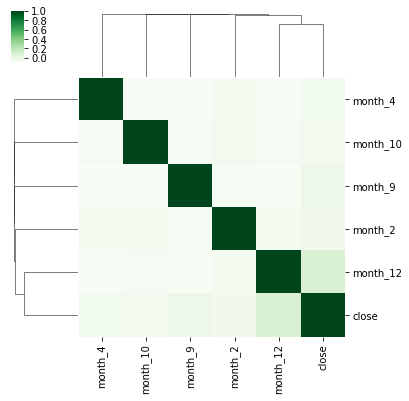

In [26]:
corr_matrix = df[selected_features].corr()
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(6,6),cmap='Greens')
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

It seems that orthogonality of the selected features are still acceptable. Then we move forward to the next stage.

In [27]:
X = df[selected_features]
y = out

### 4.2. Walk-forward Analysis

In financial application, traditional methods of validation such as Train-Test split and cross-validation are problematic for time series prediction problems. 

For example, Train-Test split is inherently more biased toward more recent data when we perform the model selection. Cross-validation is even worse: suppose the date from 2013 to 2017 are the training set, while the data 2018 is the test set. If we use cross-validation on the training set, then we will train a model that use data in 2013 and 2015 to predict the 2014 which is not advisable for sequential data.


It is advised to used a "walk-forward" approach which incorporate new information when it becomes available. This approach gives us a more realistic view of how effective our model would truly have been in the past, and helps to avoid the overfitting trap. It's often important to exclude data which is too far in the past using a rolling window. The detail can be found on [Wiki](https://en.wikipedia.org/wiki/Walk_forward_optimization)

The graph below demonstrates the idea:

![title](img/walkforward.png)

I will come back to this when I introduce the models

In [28]:
def make_walkforward_model(features,outcome,algo=LinearRegression()):
    recalc_dates = features.resample('Y').mean().index.values[:-1]
    
    ## Train models
    models = pd.Series(index=recalc_dates)
    for date in recalc_dates:    
        X_train = features.loc[slice(None,date)]
        y_train = outcome.loc[slice(None,date)]
#         print(f'Train with data prior to: {date} ({y_train.count()} obs)')
        
        model = clone(algo)
        model.fit(X_train,y_train)
        models.loc[date] = model

    begin_dates = models.index
    end_dates = models.index[1:].append(pd.to_datetime(['2099-12-31']))

    ## Generate OUT OF SAMPLE walk-forward predictions
    predictions = pd.Series(index=features.index)
    for i,model in enumerate(models): #loop thru each models object in collection
#         print(f'Using model trained on {begin_dates[i]}, Predict from: {begin_dates[i]} to: {end_dates[i]}')
        X = features.loc[slice(begin_dates[i],end_dates[i])]
        p = pd.Series(model.predict(X),index=X.index)
        predictions.loc[X.index] = p
    
    return models,predictions

def prepare_Xy(X_raw,y_raw):
    ''' Utility function to drop any samples without both valid X and y values'''
    Xy = X_raw.join(y_raw).replace({np.inf:None,-np.inf:None}).dropna()
    X = Xy.iloc[:,:-1]
    y = Xy.iloc[:,-1]
    return X,y

### 4.3. Models 

In this project, I will compare the performance of the 3 different machine learning algorithms. 

The first one is [simple linear regression](https://en.wikipedia.org/wiki/Linear_regression). Because of its simplicity, sometimes it can yield better performance than those complicated models while having a lower overfitting risk. More importantly, it is a represitative of the linear model (which is different from tree models).

The second one is [Extra-Trees (Extremely randomised trees)](https://www.quora.com/What-is-the-extra-trees-algorithm-in-machine-learning),  is a variant of a random forest. Unlike a random forest, at each step the entire sample is used and decision boundaries are picked at random, rather than the best one. In real world cases, performance is comparable to an ordinary random forest, sometimes a bit better.

The third one is a [Lasso ensemble model](https://www.kaggle.com/nottold/naive-ensemble-model-ridge-lasso) which requires the feeding in the previous models' predictions and give a hopefully better model performance by the "wisdom of the crowd". The main is to generate a single, optimally robust prediction for a regression or classification task by building multiple different models to make predictions, and then train a "meta-model" to determine how to combine the predictions of each of these multiple models. THe reason I use Lasso model is to ensure each model is assigned to a non-negative coefficient. However, one should be noted that ensemble model does not guarantee a better result.

In [29]:
linear_models,linear_preds = make_walkforward_model(X,y,algo=LinearRegression())
tree_models,tree_preds = make_walkforward_model(X,y,algo=ExtraTreesRegressor())


X_ens, y_ens = prepare_Xy(X_raw=pd.concat([linear_preds.rename('linear'),tree_preds.rename('tree')],
                                          axis=1),y_raw=y)

ensemble_models,ensemble_preds = make_walkforward_model(X_ens,y_ens,algo=LassoCV(positive=True))
ensemble_preds = ensemble_preds.rename('ensemble')



Feeding the data is when walk-forward analysis becomes interesing. We can see how coefficients of the features evolve when more training data is supplied. It can give us a sense how reliable the model is. In fact, usually the walk-forward analysis discards the furthest data when it starts incorporting new data. But since we have a rather small sample size, we do not follow this practice in this project.

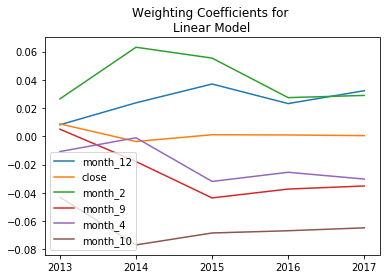

In [30]:
pd.DataFrame([model.coef_ for model in linear_models],
             columns=X.columns,index=linear_models.index).plot(title='Weighting Coefficients for \nLinear Model')

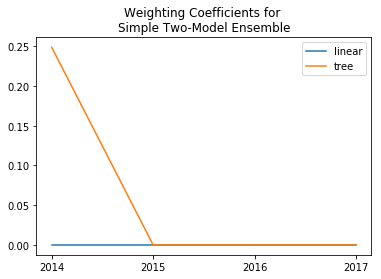

In [31]:
pd.DataFrame([model.coef_ for model in ensemble_models],
             columns=X_ens.columns,index=ensemble_models.index).plot(title='Weighting Coefficients for \nSimple Two-Model Ensemble')

### 4.4. Model Evaluation

Usually we evaluate the effectiveness of a model using $R^2$ to see how close the predictons and the true values are. However, I do not intend to build a model to fit the exact future returns but the directions of the returns. Therefore, the sign is first thing I care about. Secondly, I want to know the return(edge) if I follow the prediction of the model. Therefore, I use the following metrics to measure the model effectiveness:

- `directional_accuracy`: the percentage of predictions that were directionally correct

In [32]:
def calc_scorecard(y_pred,y_true):
    
    def make_df(y_pred,y_true):
        y_pred.name = 'y_pred'
        y_true.name = 'y_true'

        df = pd.concat([y_pred,y_true],axis=1).dropna()

        df['sign_pred'] = df.y_pred.apply(np.sign)
        df['sign_true'] = df.y_true.apply(np.sign)
        df['is_correct'] = 0
        df.loc[df.sign_pred * df.sign_true > 0 ,'is_correct'] = 1 # only registers 1 when prediction was made AND it was correct
        df['is_incorrect'] = 0
        df.loc[df.sign_pred * df.sign_true < 0,'is_incorrect'] = 1 # only registers 1 when prediction was made AND it was wrong
        df['is_predicted'] = df.is_correct + df.is_incorrect
        df['result'] = df.sign_pred * df.y_true 
        return df
    
    df = make_df(y_pred,y_true)
    
    scorecard = pd.Series()
    
    # building block metrics
#     scorecard.loc['RSQ'] = r2_score(df.y_true,df.y_pred)
#     scorecard.loc['MAE'] = mean_absolute_error(df.y_true,df.y_pred)
    scorecard.loc['directional_accuracy'] = df.is_correct.sum()*1. / (df.is_predicted.sum()*1.)*100
#     scorecard.loc['edge'] = df.result.mean()
#     scorecard.loc['noise'] = df.y_pred.diff().abs().mean()
    # derived metrics
    
#     scorecard.loc['edge_long'] = df[df.sign_pred == 1].result.mean()  - df.y_true.mean()
#     scorecard.loc['edge_short'] = df[df.sign_pred == -1].result.mean()  - df.y_true.mean()

#     scorecard.loc['edge_win'] = df[df.is_correct == 1].result.mean()  - df.y_true.mean()
#     scorecard.loc['edge_lose'] = df[df.is_incorrect == 1].result.mean()  - df.y_true.mean()

#     scorecard.loc['edge_to_noise'] = scorecard.loc['edge'] / scorecard.loc['noise']
#     scorecard.loc['edge_to_mae'] = scorecard.loc['edge'] / scorecard.loc['MAE']
    return scorecard    

Here is the result of *New China Life Insurance (601336.SH)*:

In [33]:
# calculate scores for each model
score_ens = calc_scorecard(y_pred=ensemble_preds,y_true=y_ens).rename('Ensemble')
score_linear = calc_scorecard(y_pred=linear_preds,y_true=y_ens).rename('Linear')
score_tree = calc_scorecard(y_pred=tree_preds,y_true=y_ens).rename('Tree')

scores = pd.concat([score_linear,score_tree,score_ens],axis=1)

print(scores)
# stat = scores.unstack().to_frame().sort_index(level=1).T
# stat.columns = stat.columns.map('_'.join)
# stat['sampleSize'] = len(df)
# stat['stock'] = stockCode

                         Linear       Tree   Ensemble
directional_accuracy  52.535059  50.485437  53.878116


These three models give slightly better predictions than flipping a coin. I am not certain if the model can be useful for making profit.

Other stocks just follow the same practice.

## 5. The prediction power of the models

Based on the framework described above, I apply the same procedures to every component stock in FTST China 50.

The following tables summarise the top 5 best results sorted by the directional accuracy with different assumption on the timing of entering the market and different prediction horizons.

(Note: The tree model involves random factors, the result may not be replicable, so does the ensemble model)

In [34]:
fut11 = pd.read_csv('fut_lag1_return_1_result.csv')

fut15 = pd.read_csv('fut_lag1_return_5_result.csv')


fut110 = pd.read_csv('fut_lag1_return_10_result.csv')


fut120 = pd.read_csv('fut_lag1_return_20_result.csv')


fut21 = pd.read_csv('fut_lag2_return_1_result.csv')


fut25 = pd.read_csv('fut_lag2_return_5_result.csv')


fut210 = pd.read_csv('fut_lag2_return_10_result.csv')


fut220 = pd.read_csv('fut_lag2_return_20_result.csv')


ensembleCol = ['stock', 'Ensemble_directional_accuracy']
linearCol = ['stock', 'Linear_directional_accuracy']
treeCol = ['stock', 'Tree_directional_accuracy']

### 5.1. Assume Enter the Market at t+1

### 5.1.1. Predicting 1-day returns

**Top 5 stocks enjoying highest Directional Accuracy with Ensemble Learning:**

In [35]:
fut11.sort_values('Ensemble_directional_accuracy', ascending = False)[ensembleCol].head(5).style.hide_index()

stock,Ensemble_directional_accuracy
601398SH,52.0942
601169SH,52.0422
601288SH,51.8672
000001SZ,49.8164
000776SZ,47.2057


**Top 5 stocks enjoying highest Directional Accuracy with Linear Regression:**

In [36]:
fut11.sort_values('Linear_directional_accuracy', ascending = False)[linearCol].head(5).style.hide_index()

stock,Linear_directional_accuracy
601398SH,52.8497
000776SZ,51.9321
601169SH,51.8293
601288SH,51.3843
000001SZ,50.0482


**Top 5 stocks enjoying highest Directional Accuracy with ExtraTree:**

In [37]:
fut11.sort_values('Tree_directional_accuracy', ascending = False)[treeCol].head(5).style.hide_index()

stock,Tree_directional_accuracy
000776SZ,51.9321
000001SZ,50.0482
601398SH,49.8934
601288SH,49.7732
601169SH,48.7206


### 5.1.2. Predicting 5-day returns

**Top 5 stocks enjoying highest Directional Accuracy with Ensemble Learning:**

In [38]:
fut15.sort_values('Ensemble_directional_accuracy', ascending = False)[ensembleCol].head(5).style.hide_index()

stock,Ensemble_directional_accuracy
601318SH,53.0962
601398SH,51.9112
600000SH,51.5
601288SH,51.3784
000001SZ,50.7212


**Top 5 stocks enjoying highest Directional Accuracy with Linear Regression:**

In [39]:
fut15.sort_values('Linear_directional_accuracy', ascending = False)[linearCol].head(5).style.hide_index()

stock,Linear_directional_accuracy
600000SH,55.4369
601998SH,54.2502
601818SH,53.5433
601628SH,53.4519
601328SH,53.4233


**Top 5 stocks enjoying highest Directional Accuracy with ExtraTree:**

In [40]:
fut15.sort_values('Tree_directional_accuracy', ascending = False)[treeCol].head(5).style.hide_index()

stock,Tree_directional_accuracy
601166SH,56.5628
601336SH,56.1441
600000SH,55.4369
601998SH,54.2308
601318SH,52.3364


### 5.1.3. Predicting 10-day returns

**Top 5 stocks enjoying highest Directional Accuracy with Ensemble Learning:**

In [41]:
fut110.sort_values('Ensemble_directional_accuracy', ascending = False)[ensembleCol].head(5).style.hide_index()

stock,Ensemble_directional_accuracy
000002SZ,56.6038
600036SH,54.994
601318SH,54.9407
601336SH,53.6486
000001SZ,52.9833


**Top 5 stocks enjoying highest Directional Accuracy with Linear Regression:**

In [42]:
fut110.sort_values('Linear_directional_accuracy', ascending = False)[linearCol].head(5).style.hide_index()

stock,Linear_directional_accuracy
000002SZ,61.1765
601628SH,56.6528
601166SH,56.444
601336SH,56.1441
000001SZ,55.7223


**Top 5 stocks enjoying highest Directional Accuracy with ExtraTree:**

In [43]:
fut110.sort_values('Tree_directional_accuracy', ascending = False)[treeCol].head(5).style.hide_index()

stock,Tree_directional_accuracy
000001SZ,56.2852
601166SH,54.9389
601818SH,53.861
600016SH,53.1073
600837SH,52.4816


### 5.1.4. Predicting 20-day returns

**Top 5 stocks enjoying highest Directional Accuracy with Ensemble Learning:**

In [44]:
fut120.sort_values('Ensemble_directional_accuracy', ascending = False)[ensembleCol].head(5).style.hide_index()

stock,Ensemble_directional_accuracy
601318SH,58.8933
000002SZ,58.0038
601818SH,55.407
601601SH,54.9277
600036SH,52.6316


**Top 5 stocks enjoying highest Directional Accuracy with Linear Regression:**

In [45]:
fut120.sort_values('Linear_directional_accuracy', ascending = False)[linearCol].head(5).style.hide_index()

stock,Linear_directional_accuracy
601166SH,62.956
000002SZ,57.0588
601318SH,54.7248
000776SZ,53.0819
601169SH,52.9183


**Top 5 stocks enjoying highest Directional Accuracy with ExtraTree:**

In [46]:
fut120.sort_values('Tree_directional_accuracy', ascending = False)[treeCol].head(5).style.hide_index()

stock,Tree_directional_accuracy
601818SH,60.7245
600016SH,58.4586
600036SH,57.5047
000001SZ,56.1272
600030SH,53.0387


### 5.2. Assume Enter the Market at t+2

### 5.2.1. Predicting 1-day returns

**Top 5 stocks enjoying highest Directional Accuracy with Ensemble Learning:**

In [47]:
fut21.sort_values('Ensemble_directional_accuracy', ascending = False)[ensembleCol].head(5).style.hide_index()

stock,Ensemble_directional_accuracy
601336SH,50.3392
000001SZ,50.0611
601166SH,47.6716
000776SZ,47.0868


**Top 5 stocks enjoying highest Directional Accuracy with Linear Regression:**

In [48]:
fut21.sort_values('Linear_directional_accuracy', ascending = False)[linearCol].head(5).style.hide_index()

stock,Linear_directional_accuracy
000776SZ,52.9689
601336SH,52.017
000001SZ,50.8181
601166SH,49.7121


**Top 5 stocks enjoying highest Directional Accuracy with ExtraTree:**

In [49]:
fut21.sort_values('Tree_directional_accuracy', ascending = False)[treeCol].head(5).style.hide_index()

stock,Tree_directional_accuracy
000776SZ,52.9689
601336SH,52.9224
000001SZ,50.8181
601166SH,49.7121


### 5.2.2. Predicting 5-day returns

**Top 5 stocks enjoying highest Directional Accuracy with Ensemble Learning:**

In [50]:
fut25.sort_values('Ensemble_directional_accuracy', ascending = False)[ensembleCol].head(5).style.hide_index()

stock,Ensemble_directional_accuracy
000002SZ,54.3726
601318SH,53.5526
601939SH,53.5055
600000SH,51.4963
601166SH,49.5788


**Top 5 stocks enjoying highest Directional Accuracy with Linear Regression:**

In [51]:
fut25.sort_values('Linear_directional_accuracy', ascending = False)[linearCol].head(5).style.hide_index()

stock,Linear_directional_accuracy
600000SH,55.6202
601818SH,55.054
000002SZ,55.0296
601998SH,53.2701
600030SH,52.6654


**Top 5 stocks enjoying highest Directional Accuracy with ExtraTree:**

In [52]:
fut25.sort_values('Tree_directional_accuracy', ascending = False)[treeCol].head(5).style.hide_index()

stock,Tree_directional_accuracy
600000SH,55.6202
601166SH,55.0943
600030SH,53.0331
601318SH,52.9046
601328SH,52.3671


### 5.2.3. Predicting 10-day returns

**Top 5 stocks enjoying highest Directional Accuracy with Ensemble Learning:**

In [53]:
fut210.sort_values('Ensemble_directional_accuracy', ascending = False)[ensembleCol].head(5).style.hide_index()

stock,Ensemble_directional_accuracy
601318SH,55.277
000002SZ,55.1985
601601SH,55.1451
600036SH,54.5126
601336SH,54.3243


**Top 5 stocks enjoying highest Directional Accuracy with Linear Regression:**

In [54]:
fut210.sort_values('Linear_directional_accuracy', ascending = False)[linearCol].head(5).style.hide_index()

stock,Linear_directional_accuracy
000002SZ,58.2353
601166SH,57.0085
600016SH,55.283
601601SH,54.4225
601318SH,54.0541


**Top 5 stocks enjoying highest Directional Accuracy with ExtraTree:**

In [55]:
fut210.sort_values('Tree_directional_accuracy', ascending = False)[treeCol].head(5).style.hide_index()

stock,Tree_directional_accuracy
601166SH,56.5381
601818SH,55.9846
000001SZ,55.1595
601998SH,52.9745
600016SH,52.2642


### 5.2.4. Predicting 20-day returns

**Top 5 stocks enjoying highest Directional Accuracy with Ensemble Learning:**

In [56]:
fut220.sort_values('Ensemble_directional_accuracy', ascending = False)[ensembleCol].head(5).style.hide_index()

stock,Ensemble_directional_accuracy
601318SH,59.5269
000002SZ,58.1921
601601SH,55.8476
600036SH,53.2297
601336SH,52.3617


**Top 5 stocks enjoying highest Directional Accuracy with Linear Regression:**

In [57]:
fut220.sort_values('Linear_directional_accuracy', ascending = False)[linearCol].head(5).style.hide_index()

stock,Linear_directional_accuracy
601166SH,62.5819
600016SH,54.878
000002SZ,54.8387
600837SH,52.8493
601318SH,52.6425


**Top 5 stocks enjoying highest Directional Accuracy with ExtraTree:**

In [58]:
fut220.sort_values('Tree_directional_accuracy', ascending = False)[treeCol].head(5).style.hide_index()

stock,Tree_directional_accuracy
601818SH,60.5338
000001SZ,58.1852
600016SH,55.6285
600030SH,55.1978
000776SZ,55.0138


To summarise, my modelling framework might be able to produce slightly better directional prediction than a random guess by no more than 10% at best for some stocks. Generally speaking, my model framework is better at predicting the direction of the returns in 10 to 20 trading days. Assuming whether entering the market at (t+1) or at (t+2) does not make a significant difference in the prediction power. Lastly, even though I apply ensemble learning in the hope that it can give a better prediction than the linear regression model or the ExtraTree alone, it does not seem to outperform either of them. In the next section, I will construct a dollar-neutral strategy based on each model to test on their potential profitability.

## 6. Portfolio Construction

Based on the models built in Section 5, I construct simple long-short dollar-neutral portfolios for each of them. The strategy is straight-forward: For each model, I pick the top 3 stocks with highest the directional prediction accuracies. They will then form a portfolio together with SSE 50 Index Futures. For every dollar I invest in these three stocks, I need short equal dollar amount of the Index to make my dollar/cash account zero at any given time. 

Apart from its relatively high liquidity and high correlation with the FTSE A50, there are 2 additional reasons that I choose SSE 50 Index Futures to balance the account:

1. In A share market, investors are not allowed to short individual stocks, but are allowed to short index futures


2. Even if the exchange allowed to short stocks, shorting individual stocks may create idiosyncratic risks born with the stocks themselves, e.g. short-squeezing. It defeats the purpose of minimizing the market exposure.

Several assumptions are made when constructing the portfolios:

1. Trading unit for each stock is 100,


2. When there is a long signal for the stock, I long a trading unit of it; when there is a short signal, I liquidate all my position for this stock.


3. The transaction cost (T-Cost) of each transaction is 0.2% of the total dollar amount transacted.


4. I assume I am able to long/short any dollar amount of the Index Futures at any given time, including fractional amount of the Index Futures. This assumption simplifies my trading strategy and performance analysis by avoiding the nuisance of incomplete hedging.


5. Since I build my models by walking forward, it is equivalent to I use my model since 2014 and update my model using all the data available at that time at the end of each year. Therefore, the backtest can be run from 2014 to 2018 without the need of specifying the training sets and the test sets.

The remainder of this section summarises the backtest statistics of each porfolio:

In [59]:
def get_prediction(stockCode, lag = 2, horizon = 20, model = 'linear'):
    
    address = "stock/" + stockCode + ".csv"
    col = ['trade_date','close','vol']
    stock1 = pd.read_csv(address)[col]
    stock1['trade_date'] = stock1['trade_date'].astype('str').apply(lambda x: datetime.strptime(x, "%Y%m%d"))
    stock1 = stock1.set_index('trade_date').sort_index().fillna(method='ffill')

    ### Price Feature Matrix

    # pct change
    stock1['past_ret_1'] = stock1.close.pct_change(1) # past day's returns
    stock1['past_ret_5'] = stock1.close.pct_change(5) # past week's returns
    stock1['past_ret_10'] = stock1.close.pct_change(10) # past two weeks' returns
    stock1['past_ret_20'] = stock1.close.pct_change(20) # past month's (approx) returns
    stock1['logVol'] = stock1.vol.apply(np.log)
    stock1['past_logVol_1'] = stock1.logVol.pct_change(1) # past day's change of log volume
    stock1['past_logVol_5'] = stock1.logVol.pct_change(5) # past week's change of log volume
    stock1['past_logVol_10'] = stock1.logVol.pct_change(10) # past two weeks' change of log volume
    stock1['past_logVol_20'] = stock1.logVol.pct_change(20) # past month's change of log volume

    # rolling mean or std
    stock1['roll_Close_Mean_200'] = stock1['close'].rolling(window=200, min_periods=20).mean().shift(1)
    stock1['roll_Close_Std_200'] = stock1['close'].rolling(window=200, min_periods=20).std().shift(1)
    stock1['roll_LogVol_Mean_200'] = stock1['logVol'].rolling(window=200, min_periods=20).mean().shift(1)
    stock1['roll_LogVol_Std_200'] = stock1['logVol'].rolling(window=200, min_periods=20).std().shift(1)

    # z-score
    stock1['zscore_price'] = (stock1['close'] - stock1['roll_Close_Mean_200'] ) / stock1['roll_Close_Std_200'] 
    stock1['zscore_logVol'] = (stock1['logVol'] - stock1['roll_LogVol_Mean_200'] ) / stock1['roll_LogVol_Std_200'] 

    # change sign
    stock1['sign_LogVol_1'] = stock1['past_logVol_1'].apply(np.sign)
    stock1['sign_Ret_1'] = stock1['past_ret_1'].apply(np.sign)

    ### Outcome Feature

    out_stock1 = pd.DataFrame(index = stock1.index)
    
    ### Assume T+lag enter the market
    out_stock1['outcome'] = stock1.close.pct_change(horizon).shift(-(lag+horizon)) # returns

    #   dropna
    out_stock1 = out_stock1.dropna()

    ### News Feature Matrix

    news = pd.read_csv('dummy_matrix.csv').drop('Unnamed: 0', axis =1)
    news['date'] =  pd.to_datetime(news['date'], format='%Y-%m-%d')

    # The keywords of news
    news_keywords = pd.read_csv('news_sent_kw_tag.csv')[['date', 'keywords']]

    # The keywords of the companys
    stock_keywords = pd.read_csv('stock_keywords.csv')
    stock_keywords['keywords'] = stock_keywords['keywords'].apply(literal_eval)
    keyword1 = stock_keywords[stock_keywords['code'] == stockCode ]['keywords'].iloc[0]

    # Find those relevant news for this compnay

    news_keywords['relevant'] = news_keywords['keywords'].apply(lambda x: any([word in x for word in keyword1]))

    ### Relevant News
    news = news.iloc[news_keywords[news_keywords['relevant']].index]
    news['date'] = pd.to_datetime(news['date'], format='%Y-%m-%d')

    ### Summarise the News on that date
    groupbyNews = news.groupby('date').agg({'lv1_tag_国际': 'sum', 'lv1_tag_时事': 'sum',
                                            'lv1_tag_社会': 'sum', 'lv1_tag_财经': 'sum',
                                            'sentiment_pos': 'mean',
                                            'dayofweek_1': 'mean', 'dayofweek_2': 'mean', 'dayofweek_3': 'mean',
                                            'dayofweek_4': 'mean', 'dayofweek_5': 'mean', 'dayofweek_6': 'mean',
                                            'quarter_2': 'mean', 'quarter_3': 'mean', 'quarter_4': 'mean',
                                            'month_2': 'mean', 'month_3': 'mean', 'month_4': 'mean', 'month_5': 'mean',
                                            'month_6': 'mean', 'month_7': 'mean', 'month_8': 'mean', 'month_9': 'mean',
                                            'month_10': 'mean', 'month_11': 'mean','month_12': 'mean',})

    # The preditive feature matrix
        # if the news is not released in a trading day, then ignore

    feature1 = groupbyNews.join(stock1, how = 'inner')

    ### Standardize predictive features
    # maybe problematic here, consider other schemes
#     std_scaler = StandardScaler()
    features_scaled = feature1.dropna()

    df = pd.DataFrame(features_scaled,index=feature1.dropna().index)
    df.columns = feature1.dropna().columns

    ### Find the indices that both feature matrix and the outcome matrix share
    index = df.index.intersection(out_stock1['outcome'].index)
    out = out_stock1['outcome'].loc[index]
    df = df.loc[index]
    
    ### Feature Selection
    corrThres = 0.1
    
    corr = df.corrwith(out)
    selected_features = corr[abs(corr)>corrThres].sort_values(ascending=False).index.tolist()


    X = df[selected_features]
    y = out
    
    if model == "linear":
        models,preds = make_walkforward_model(X,y,algo=LinearRegression())
    elif model == 'tree':
        models,preds = make_walkforward_model(X,y,algo=ExtraTreesRegressor())
    elif model == 'ensemble':
        linear_models, linear_preds = make_walkforward_model(X,y,algo=LinearRegression())
        tree_models, tree_preds = make_walkforward_model(X,y,algo=ExtraTreesRegressor())
        X_ens, y_ens = prepare_Xy(X_raw=pd.concat([linear_preds.rename('linear'),tree_preds.rename('tree')],
                                              axis=1),y_raw=y)
        models,preds = make_walkforward_model(X_ens,y_ens,algo=LassoCV(positive=True))
        preds = preds.rename('ensemble')
    
    return preds
 
def getBacktest(stockCode, preds, lag = 2, shortSell = True, tCostRate = 0.0002):
    
    tradingUnit = 100
    
    address = "stock/" + stockCode + ".csv"
    col = ['trade_date','close','change','pct_chg']
    stock = pd.read_csv(address)[col]          
    stock['trade_date'] = stock['trade_date'].astype('str').apply(lambda x: datetime.strptime(x, "%Y%m%d"))
    
    # originally `pct_chg` and 'change' are compared to the previous day
    # it is changed to `pct_chg` and 'change' of tomorrow if I enter today
    stock['pct_chg'] = stock['pct_chg'].shift(1)
    stock['change'] = stock['change'].shift(1)    
    stock = stock.set_index('trade_date').sort_index().fillna(method='ffill')
    
    stock = stock.join(np.sign(preds.shift(lag)).rename('y_pred'), how = 'left').fillna(0)
    start = preds[~preds.isna()].index[0]
    end = preds[~preds.isna()].index[-1]
    stock = stock.loc[start:end]

    stock['position'] = 0
        
    if shortSell:
    
        for i in range(len(stock)):
            if stock['y_pred'].iloc[i] * stock['position'].iloc[i-1] > 0:
                stock['position'].iloc[i] = stock['position'].iloc[i-1] + stock['y_pred'].iloc[i] * tradingUnit
            elif stock['y_pred'].iloc[i] * stock['position'].iloc[i-1] == 0:
                if stock['position'].iloc[i-1] == 0 and stock['y_pred'].iloc[i] != 0:
                    stock['position'].iloc[i] = stock['y_pred'].iloc[i] * tradingUnit
                else:
                    stock['position'].iloc[i] = stock['position'].iloc[i-1] 
            elif stock['y_pred'].iloc[i] * stock['position'].iloc[i-1] < 0:
                stock['position'].iloc[i] = 0
    else:
        for i in range(len(stock)):
            if stock['y_pred'].iloc[i] > 0:
                stock['position'].iloc[i] = stock['position'].iloc[i-1] + tradingUnit
            elif stock['y_pred'].iloc[i] == 0:
                stock['position'].iloc[i] = stock['y_pred'].iloc[i]
            elif stock['y_pred'].iloc[i-1] < 0:
                stock['position'].iloc[i] = 0


    stock['pos_chg'] = stock['position'].diff().fillna(0)
    stock['transaction'] = -stock['pos_chg'] * stock['close']
    stock['tCost'] = abs(stock['transaction'] * tCostRate)
    stock['cumTCost'] = stock['tCost'].cumsum()
    stock['dollarReturn'] = stock['position'] * stock['change']
    stock['cumDollarReturn'] = stock['dollarReturn'].cumsum()
    stock['dollarReturnNetTCost'] = stock['dollarReturn'] - stock['tCost']
    stock['cumDollarReturnNetTCost'] = stock['dollarReturnNetTCost'].cumsum()
    
    return stock

def SSE50_dollar_neutral(DollarTransaction, startDate, endDate, tCostRate = 0.002):
    
    totalDollarTransaction = DollarTransaction.sum(axis = 1)
    
    SSE50 = pd.read_csv('index/SSE50.csv')
    col = ['trade_date','close','change','pct_chg']
    SSE50 = SSE50[col]
    SSE50['trade_date'] = SSE50['trade_date'].astype('str').apply(lambda x: datetime.strptime(x, "%Y%m%d"))
    SSE50['change'] = SSE50['change'].shift(1)
    SSE50 = SSE50.set_index('trade_date').sort_index().fillna(method='ffill')
    SSE50 = SSE50.loc[startDate:endDate]
    SSE50['transaction_dollar'] = -totalDollarTransaction
    SSE50['fraction'] = SSE50['transaction_dollar'] / SSE50['close']
    SSE50['position'] = SSE50['fraction'].cumsum()
    SSE50['dollarReturn'] = SSE50['position'] * SSE50['change']
    SSE50['cumDollarReturn'] = SSE50['dollarReturn'].cumsum()
    SSE50['tCost'] = abs(SSE50['transaction_dollar'] * tCostRate)
    SSE50['dollarReturnNetTCost'] = SSE50['dollarReturn'] - SSE50['tCost']
    SSE50['cumDollarReturnNetTCost'] = SSE50['dollarReturnNetTCost'].cumsum()
    
    return SSE50

def port_dollar_neutral_bactest(components, lag = 2, horizon = 20, shortSell = False, model = 'linear'):
    
    
    dollarReturn = []
    dollarReturnNetTCost = []    
    cumDollarReturn = []
    cumDollarReturnNetTCost = []
    transaction = []
    tCost = []

    for stockCode in components:
        preds = get_prediction(stockCode, lag = lag, horizon = horizon, model = model)
        result = getBacktest(stockCode, preds, lag = lag, shortSell = shortSell, tCostRate = 0.0002)
        
        dollarReturn.append(result['dollarReturn'].rename(stockCode))
        dollarReturnNetTCost.append(result['dollarReturnNetTCost'].rename(stockCode))

        
        cumDollarReturn.append(result['cumDollarReturn'].rename(stockCode))
        cumDollarReturnNetTCost.append(result['cumDollarReturnNetTCost'].rename(stockCode))
        
        transaction.append(result['transaction'].rename(stockCode))
        tCost.append(result['tCost'].rename(stockCode))
        


    dollarReturn = pd.concat(dollarReturn, axis=1, join='outer').fillna(method = 'ffill')
    dollarReturnNetTCost = pd.concat(dollarReturnNetTCost, axis=1, join='outer').fillna(method = 'ffill')    
    
    cumDollarReturn = pd.concat(cumDollarReturn, axis=1, join='outer').fillna(method = 'ffill')
    cumDollarReturnNetTCost = pd.concat(cumDollarReturnNetTCost, axis=1, join='outer').fillna(method = 'ffill')
    
    transaction = pd.concat(transaction, axis=1, join='outer').fillna(method = 'ffill')
    tCost = pd.concat(tCost, axis=1, join='outer').fillna(method = 'ffill')

    SSE50 = SSE50_dollar_neutral(transaction, cumDollarReturn.index[0], cumDollarReturn.index[-1])

    dollarReturn['SSE50'] = SSE50['dollarReturn']
    dollarReturnNetTCost['SSE50'] = SSE50['dollarReturnNetTCost']
    cumDollarReturn['SSE50'] = SSE50['cumDollarReturn']
    cumDollarReturnNetTCost['SSE50'] = SSE50['cumDollarReturnNetTCost']
    tCost['SSE50'] = SSE50['tCost']


    dollarReturn['Portfolio'] = dollarReturn.sum(axis = 1)
    dollarReturnNetTCost['Portfolio'] = dollarReturnNetTCost.sum(axis = 1)
    
    cumDollarReturn['Portfolio'] = cumDollarReturn.sum(axis = 1)
    cumDollarReturnNetTCost['Portfolio'] = cumDollarReturnNetTCost.sum(axis = 1)
    
    tCost['Portfolio'] = tCost.sum(axis = 1)
    tCost['Cum.TCost'] = tCost['Portfolio'].cumsum()

    
#     dollarReturn.plot(figsize = (30,10))
#     plt.xlabel('Year', fontsize=16);
#     plt.ylabel('Dollar', fontsize=18);
#     plt.title('Dollar Return', fontsize=25);
    
    cumDollarReturn.plot(figsize = (25,10))
    plt.xlabel('Year', fontsize=16);
    plt.ylabel('Dollar', fontsize=18);
    plt.title('Cumulative Dollar Return', fontsize=25);
    
    cumDollarReturnNetTCost.plot(figsize = (25,10))
    plt.xlabel('Year', fontsize=16);
    plt.ylabel('Dollar', fontsize=18);
    plt.title('Cumulative Dollar Return Net T-Cost', fontsize=25);
    
    tCost.plot(figsize = (25,10), secondary_y = ['Cum.TCost'])
    plt.xlabel('Year', fontsize=18);
    plt.ylabel('Dollar', fontsize=18);
    plt.title('Transaction Cost', fontsize=25);
    
    
    MMD_end = np.argmax(np.maximum.accumulate(cumDollarReturnNetTCost['Portfolio']) - cumDollarReturnNetTCost['Portfolio']) # end of the period
    MMD_start = np.argmax(cumDollarReturnNetTCost['Portfolio'].loc[:MMD_end]) # start of period
    
    print("************************************************************************************")
    print("**************************  Statistics of the Portfolio  ***************************")
    print("************************************************************************************")
    print("Average Dollar Earned before T-cost per day holding position: ", '\t\t${:,.2f}'.format(dollarReturn['Portfolio'].replace(0, np.nan).mean(skipna=True)))
    print("Total Dollar Earned before T-cost: ", '\t\t\t\t\t${:,.2f}'.format(cumDollarReturn['Portfolio'].iloc[-1]))
    print("Average Dollar Return after T-cost per day holding position: ", '\t\t${:,.2f}'.format(dollarReturnNetTCost['Portfolio'].replace(0, np.nan).mean(skipna=True)))
    print("Total Dollar Earned after T-cost: ", '\t\t\t\t\t${:,.2f}'.format(cumDollarReturnNetTCost['Portfolio'].iloc[-1]))
    print("Maximum Daily Dollar Earned after T-cost: ", '\t\t\t\t${:,.2f}'.format(max(dollarReturnNetTCost['Portfolio'])))
    print("Minimum Daily Dollar Earned after T-cost: ", '\t\t\t\t${:,.2f}'.format(min(dollarReturnNetTCost['Portfolio'])))
    print("Maximum Drawdown: ", '\t\t\t\t\t\t\t{:,.2%}'.format((cumDollarReturnNetTCost['Portfolio'].loc[MMD_end] - cumDollarReturnNetTCost['Portfolio'].loc[MMD_start] )/cumDollarReturnNetTCost['Portfolio'].loc[MMD_start]))
    print("Maximum Drawdown Period: ", "\t\t\t\t\t", MMD_start.date(), "-", MMD_end.date())

### 6.1. Assume Enter the Market at t+1

### 6.1.1. Constructing the portfolio based on the models of 1-day return prediction:

Ensemble Learning:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$-0.71
Total Dollar Earned before T-cost:  					$-3,836.74
Average Dollar Return after T-cost per day holding position:  		$-6.18
Total Dollar Earned after T-cost:  					$-9,143.66
Maximum Daily Dollar Earned after T-cost:  				$18,412.08
Minimum Daily Dollar Earned after T-cost:  				$-15,085.81
Maximum Drawdown:  							-151.44%
Maximum Drawdown Period:  					 2015-06-05 - 2015-08-24


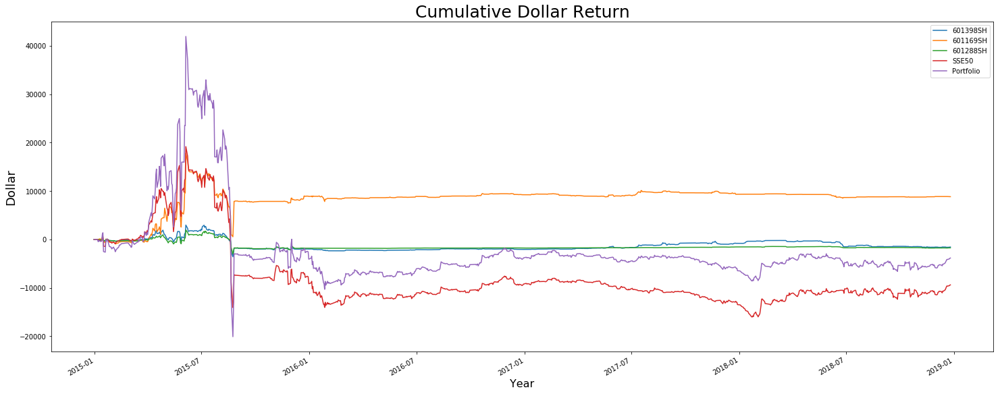

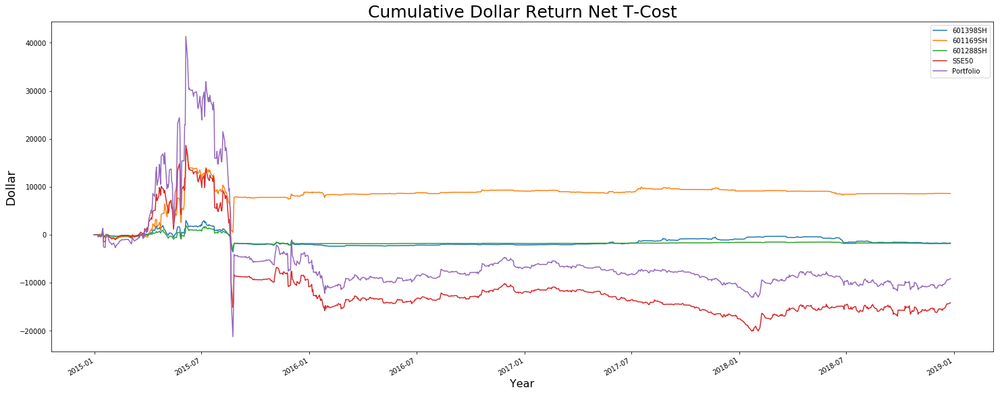

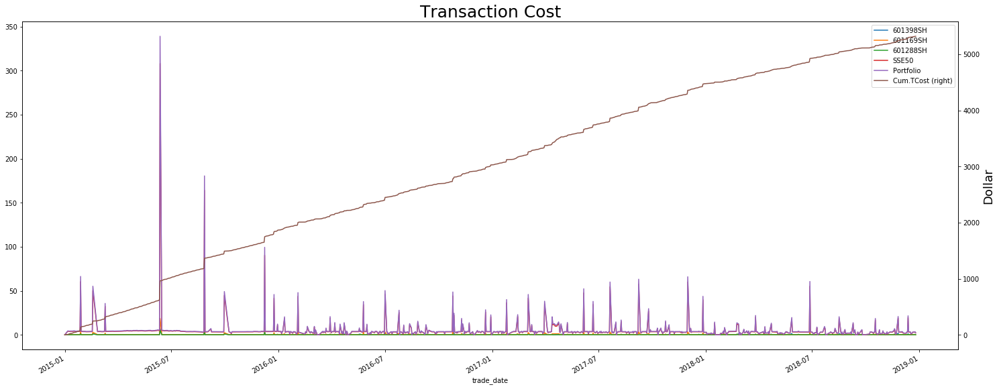

In [60]:
components = [i for i in pd.read_csv('fut_lag1_return_1_result.csv').sort_values('Ensemble_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 1, shortSell = False, model = 'ensemble')

Linear Regression:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$33.55
Total Dollar Earned before T-cost:  					$32,078.54
Average Dollar Return after T-cost per day holding position:  		$28.83
Total Dollar Earned after T-cost:  					$26,353.76
Maximum Daily Dollar Earned after T-cost:  				$11,814.84
Minimum Daily Dollar Earned after T-cost:  				$-15,853.44
Maximum Drawdown:  							-78.75%
Maximum Drawdown Period:  					 2015-05-25 - 2015-08-24


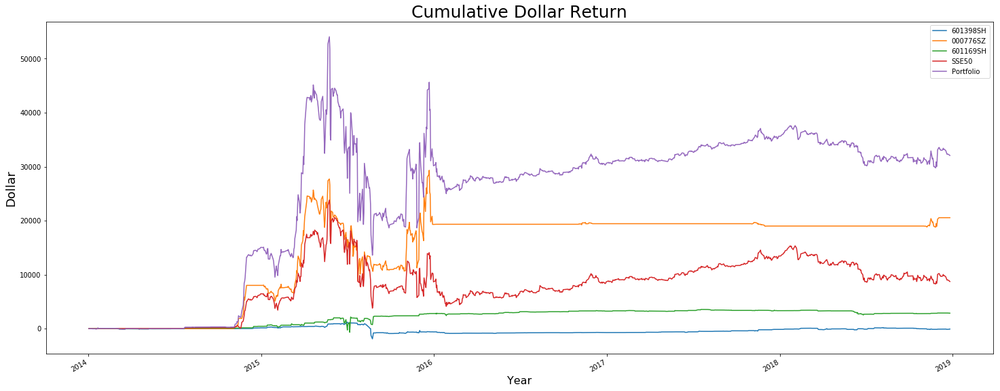

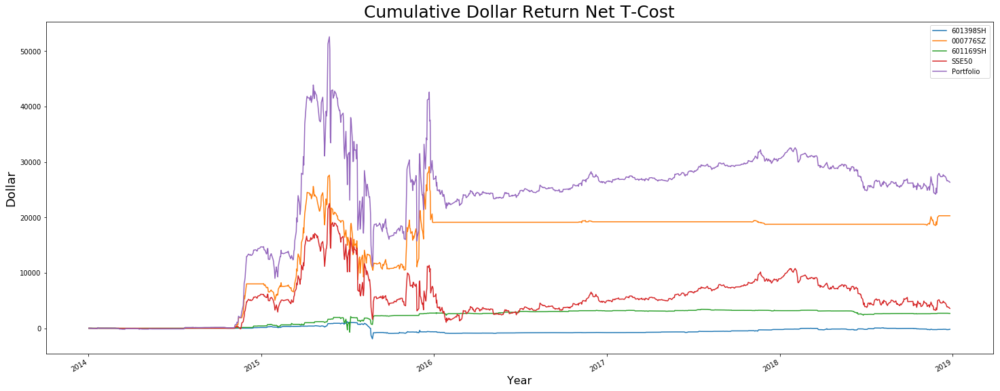

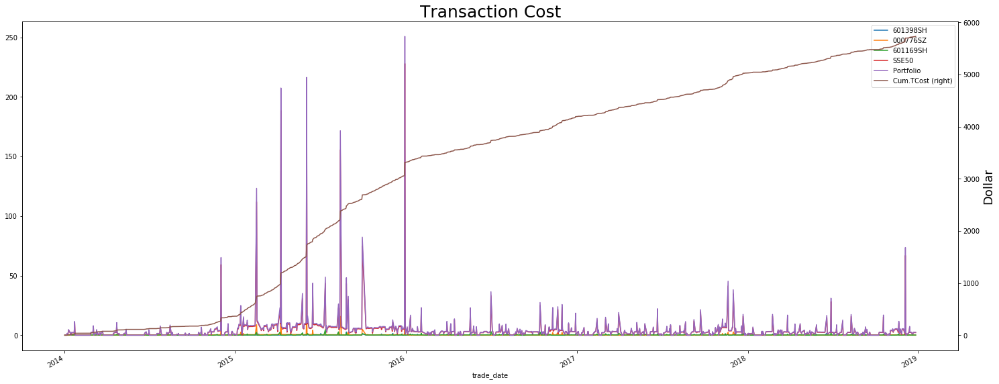

In [61]:
components = [i for i in pd.read_csv('fut_lag1_return_1_result.csv').sort_values('Linear_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 1, shortSell = False, model = 'linear')

ExtraTree:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$52.47
Total Dollar Earned before T-cost:  					$57,885.50
Average Dollar Return after T-cost per day holding position:  		$45.96
Total Dollar Earned after T-cost:  					$49,952.86
Maximum Daily Dollar Earned after T-cost:  				$17,214.14
Minimum Daily Dollar Earned after T-cost:  				$-28,640.01
Maximum Drawdown:  							-73.89%
Maximum Drawdown Period:  					 2015-05-25 - 2015-08-24


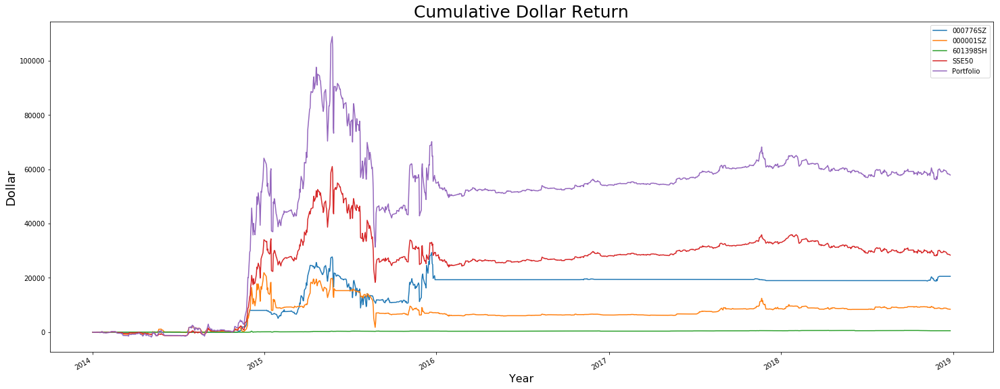

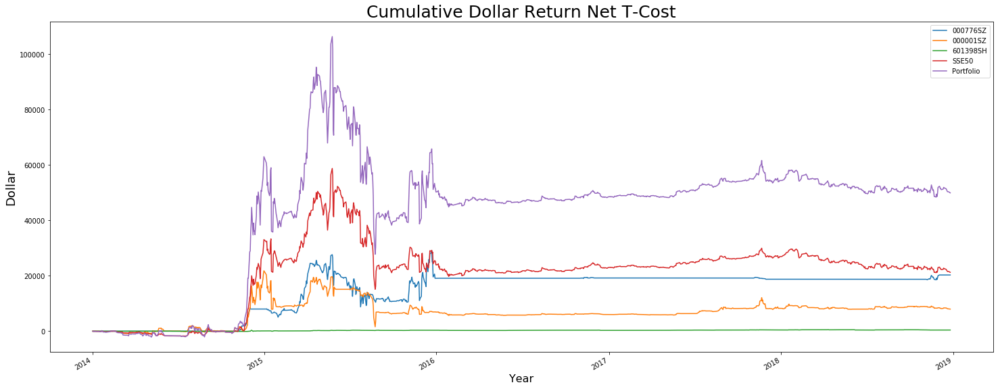

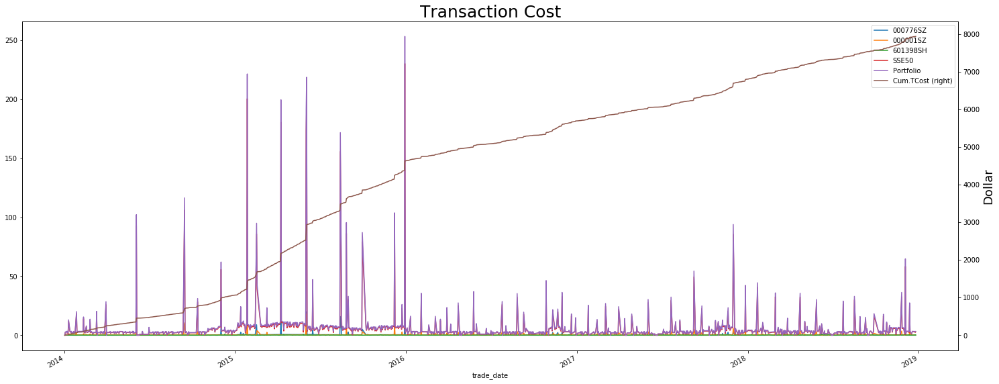

In [62]:
components = [i for i in pd.read_csv('fut_lag1_return_1_result.csv').sort_values('Tree_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 1, shortSell = False, model = 'tree')

### 6.1.2. Constructing the portfolio based on the models of 5-day return prediction:

Ensemble Learning:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$-27.61
Total Dollar Earned before T-cost:  					$-22,718.70
Average Dollar Return after T-cost per day holding position:  		$-50.92
Total Dollar Earned after T-cost:  					$-45,296.22
Maximum Daily Dollar Earned after T-cost:  				$25,667.37
Minimum Daily Dollar Earned after T-cost:  				$-43,599.38
Maximum Drawdown:  							-175.18%
Maximum Drawdown Period:  					 2015-05-25 - 2015-08-24


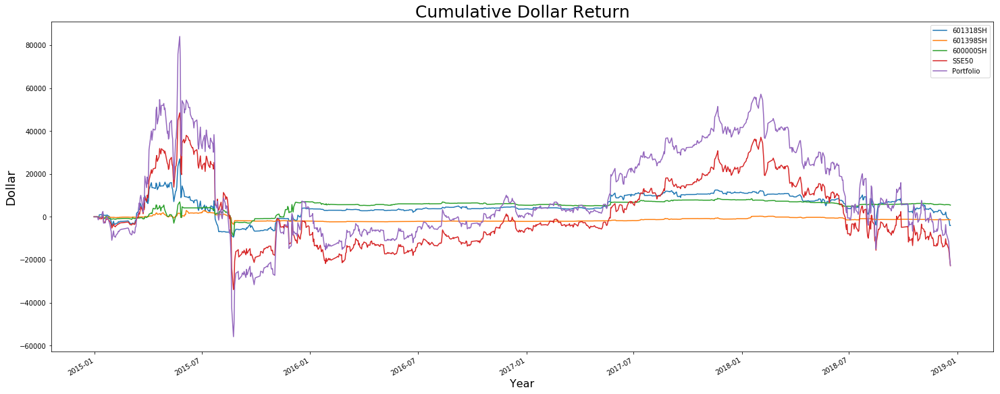

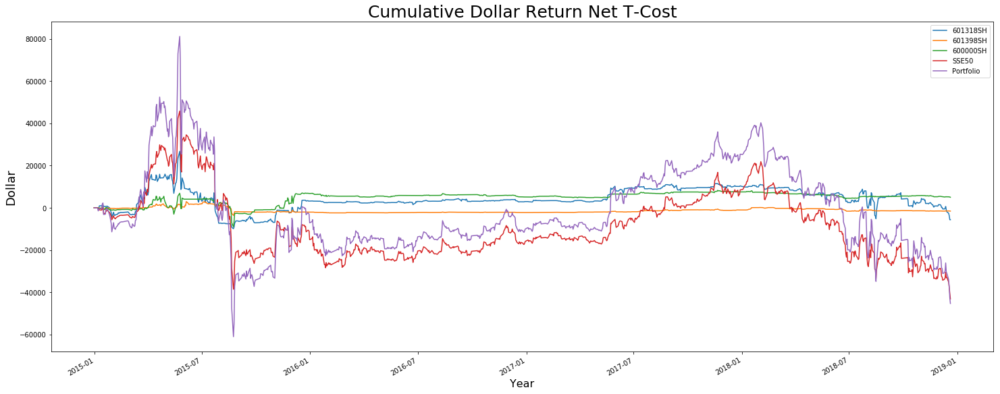

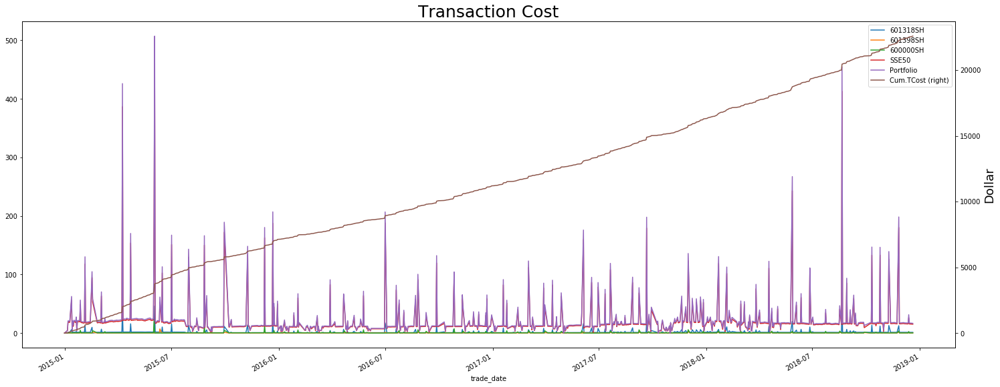

In [63]:
components = [i for i in pd.read_csv('fut_lag1_return_5_result.csv').sort_values('Ensemble_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 5, shortSell = False, model = 'ensemble')

Linear Regression:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$43.48
Total Dollar Earned before T-cost:  					$51,583.97
Average Dollar Return after T-cost per day holding position:  		$38.07
Total Dollar Earned after T-cost:  					$45,027.57
Maximum Daily Dollar Earned after T-cost:  				$11,024.54
Minimum Daily Dollar Earned after T-cost:  				$-21,915.15
Maximum Drawdown:  							-62.28%
Maximum Drawdown Period:  					 2015-01-15 - 2015-08-24


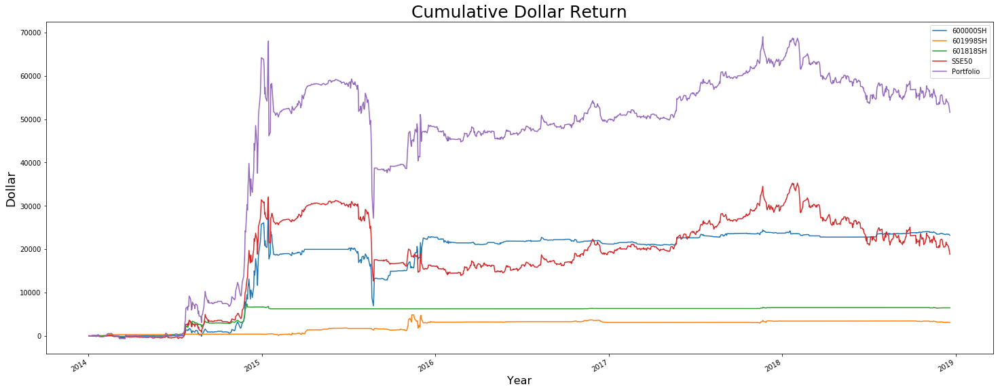

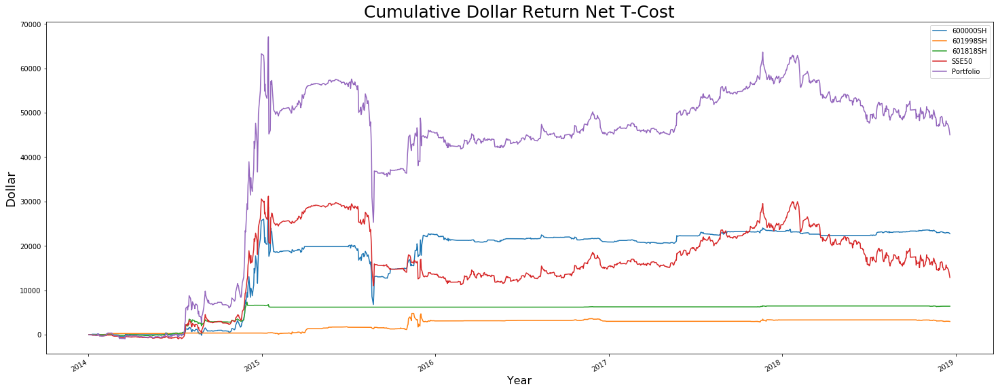

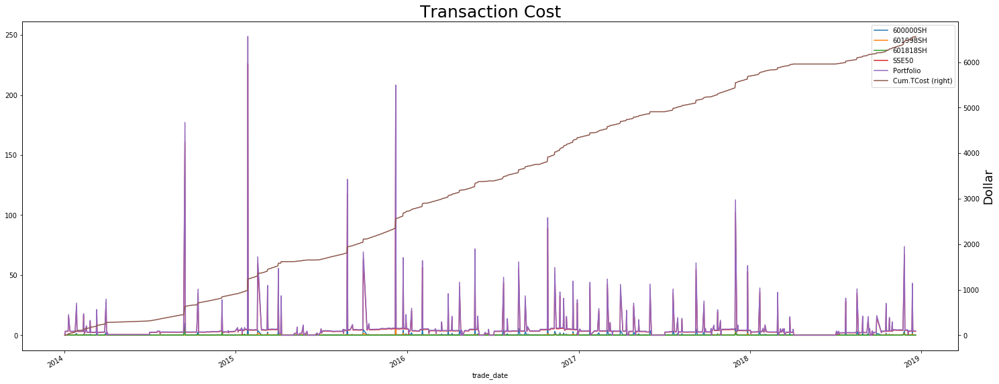

In [64]:
components = [i for i in pd.read_csv('fut_lag1_return_5_result.csv').sort_values('Linear_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 5, shortSell = False, model = 'linear')

ExtraTree:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$44.24
Total Dollar Earned before T-cost:  					$58,787.69
Average Dollar Return after T-cost per day holding position:  		$33.59
Total Dollar Earned after T-cost:  					$45,903.22
Maximum Daily Dollar Earned after T-cost:  				$19,503.90
Minimum Daily Dollar Earned after T-cost:  				$-22,787.33
Maximum Drawdown:  							-107.24%
Maximum Drawdown Period:  					 2015-06-05 - 2015-08-24


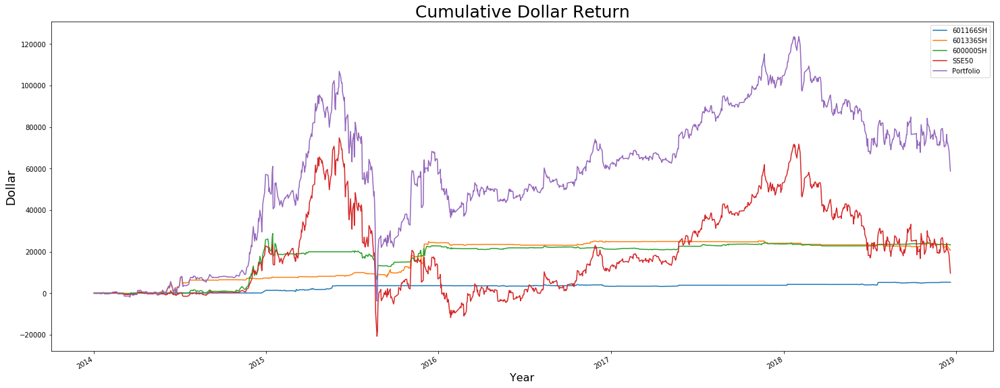

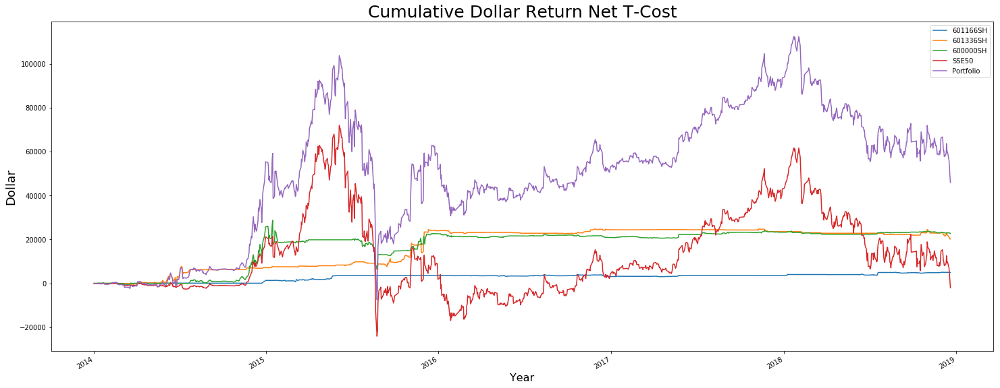

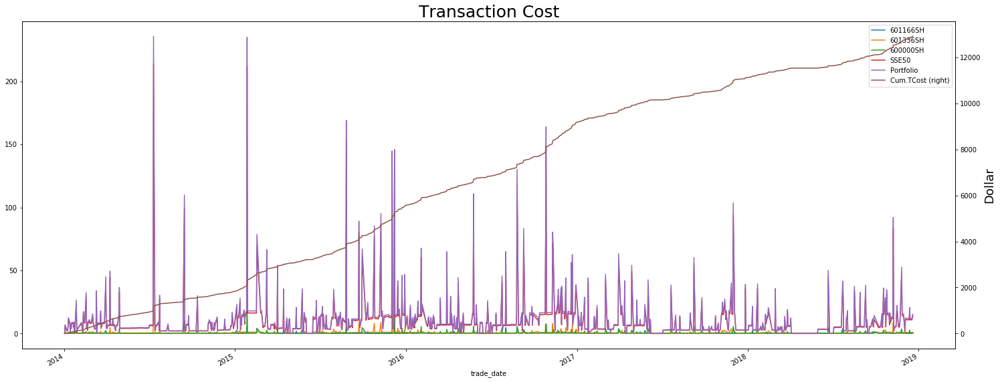

In [65]:
components = [i for i in pd.read_csv('fut_lag1_return_5_result.csv').sort_values('Tree_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 5, shortSell = False, model = 'tree')

### 6.1.3. Constructing the portfolio based on the models of 10-day return prediction:

Ensemble Learning:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$-40.68
Total Dollar Earned before T-cost:  					$-53,298.40
Average Dollar Return after T-cost per day holding position:  		$-66.52
Total Dollar Earned after T-cost:  					$-78,142.06
Maximum Daily Dollar Earned after T-cost:  				$22,593.53
Minimum Daily Dollar Earned after T-cost:  				$-40,312.67
Maximum Drawdown:  							-262.63%
Maximum Drawdown Period:  					 2015-05-25 - 2018-01-23


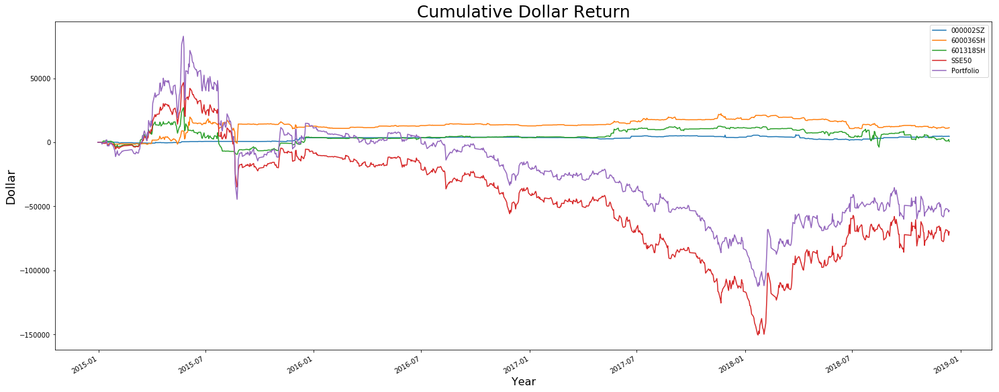

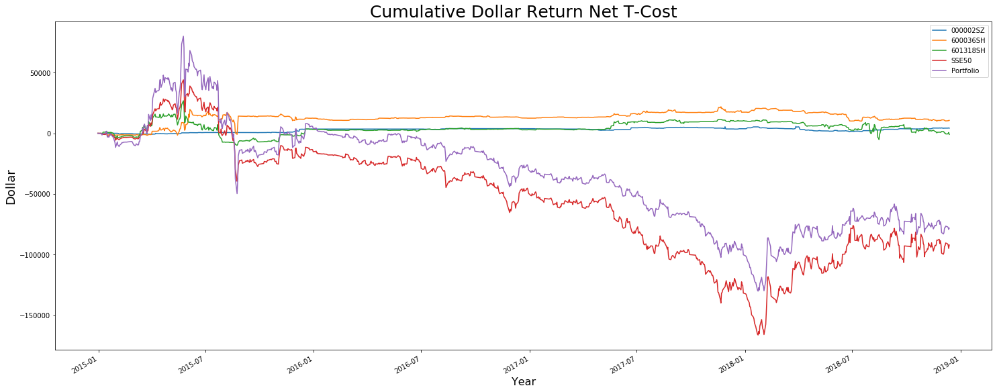

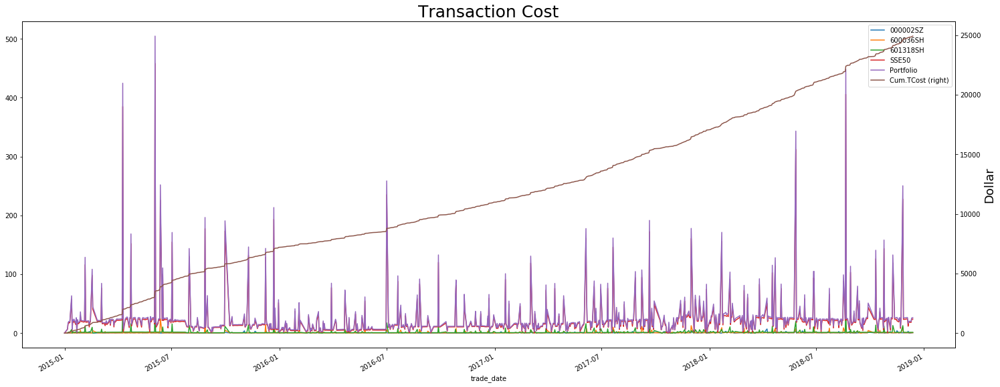

In [66]:
components = [i for i in pd.read_csv('fut_lag1_return_10_result.csv').sort_values('Ensemble_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 10, shortSell = False, model = 'ensemble')

Linear Regression:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$65.51
Total Dollar Earned before T-cost:  					$77,797.07
Average Dollar Return after T-cost per day holding position:  		$58.37
Total Dollar Earned after T-cost:  					$69,176.68
Maximum Daily Dollar Earned after T-cost:  				$7,723.73
Minimum Daily Dollar Earned after T-cost:  				$-7,748.73
Maximum Drawdown:  							-23.24%
Maximum Drawdown Period:  					 2014-12-31 - 2015-01-30


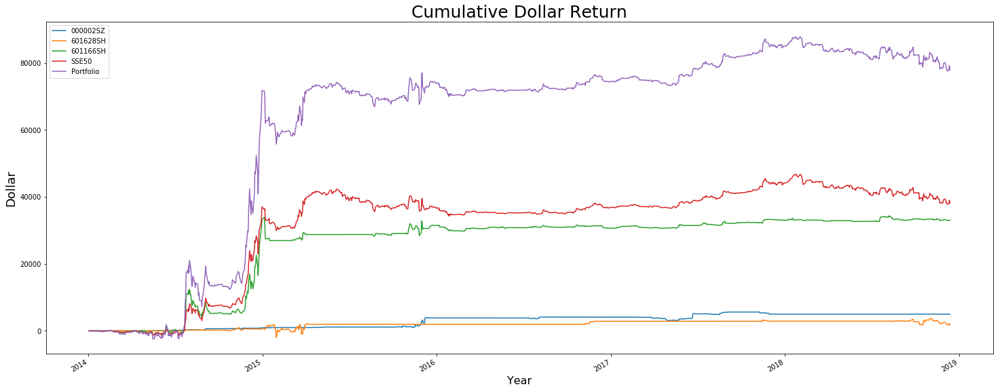

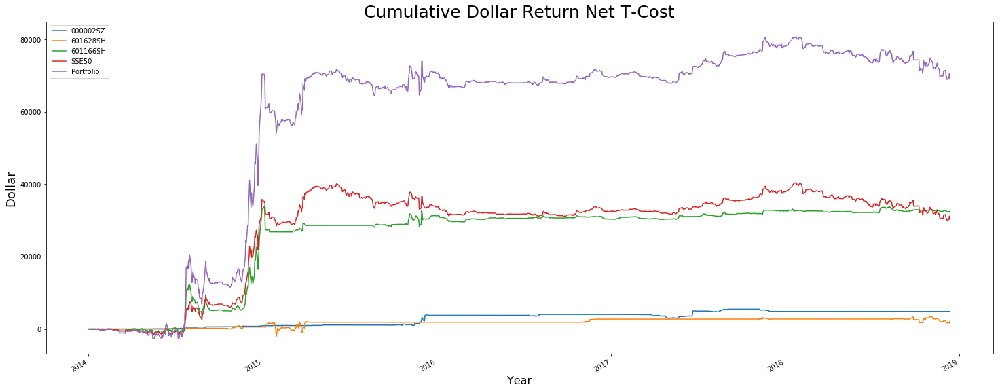

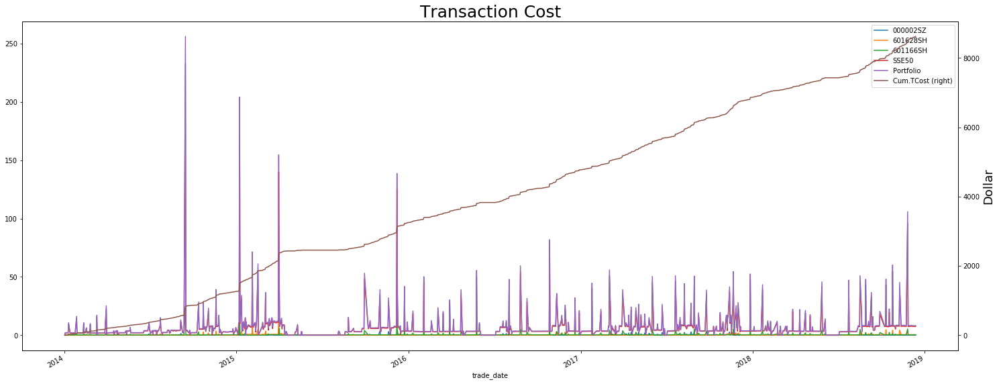

In [67]:
components = [i for i in pd.read_csv('fut_lag1_return_10_result.csv').sort_values('Linear_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 10, shortSell = False, model = 'linear')

ExtraTree:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$100.18
Total Dollar Earned before T-cost:  					$119,912.52
Average Dollar Return after T-cost per day holding position:  		$94.06
Total Dollar Earned after T-cost:  					$112,522.47
Maximum Daily Dollar Earned after T-cost:  				$13,832.76
Minimum Daily Dollar Earned after T-cost:  				$-17,182.24
Maximum Drawdown:  							-29.18%
Maximum Drawdown Period:  					 2014-12-19 - 2014-12-23


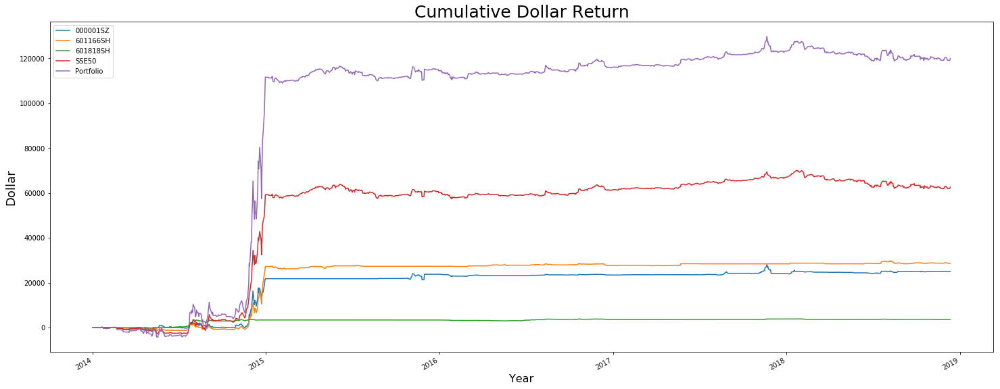

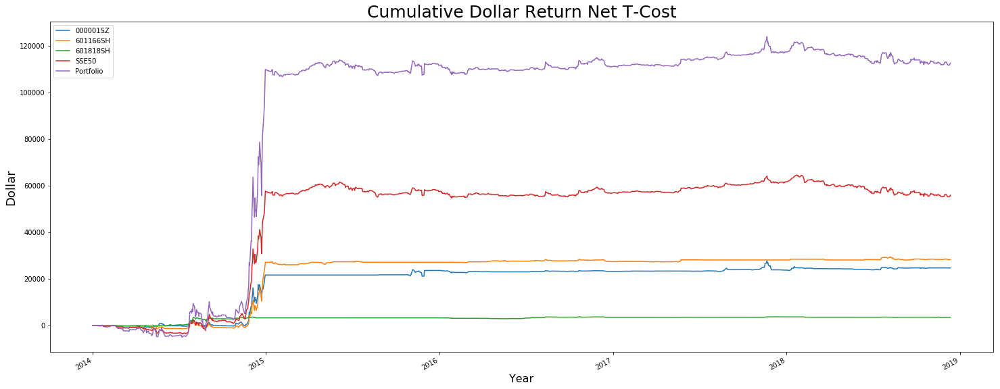

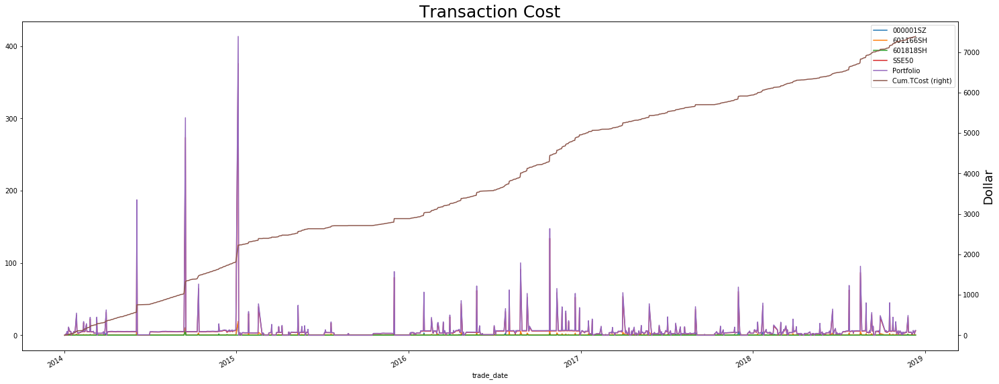

In [68]:
components = [i for i in pd.read_csv('fut_lag1_return_10_result.csv').sort_values('Tree_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 10, shortSell = False, model = 'tree')

### 6.1.4. Constructing portfolio based on the models of 20-day return prediction:

Ensemble Learning:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$-1.04
Total Dollar Earned before T-cost:  					$-1,162.29
Average Dollar Return after T-cost per day holding position:  		$-21.71
Total Dollar Earned after T-cost:  					$-20,872.43
Maximum Daily Dollar Earned after T-cost:  				$17,313.21
Minimum Daily Dollar Earned after T-cost:  				$-31,714.75
Maximum Drawdown:  							-160.69%
Maximum Drawdown Period:  					 2015-05-25 - 2015-08-24


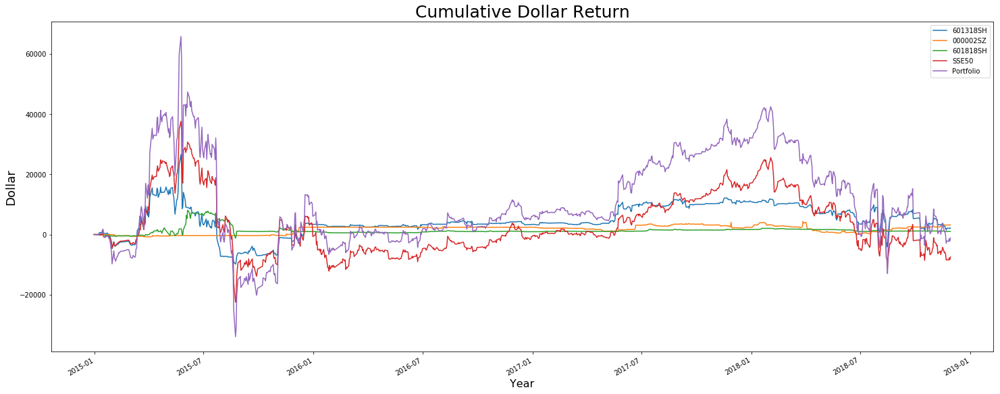

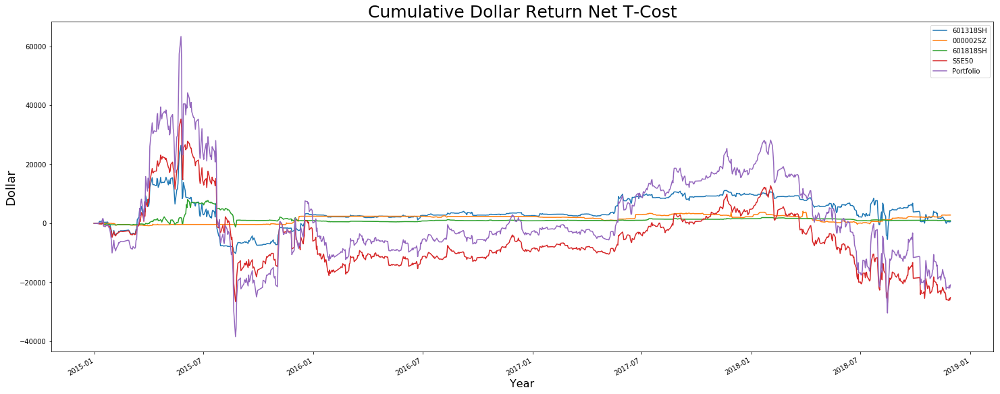

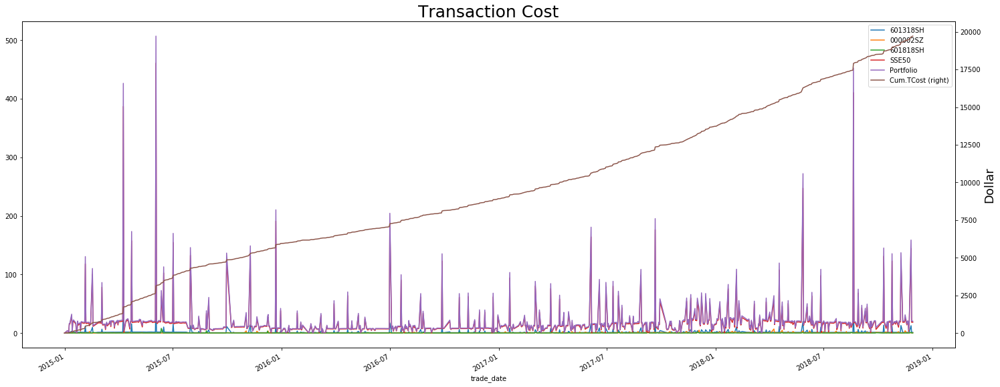

In [69]:
components = [i for i in pd.read_csv('fut_lag1_return_20_result.csv').sort_values('Ensemble_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 20, shortSell = False, model = 'ensemble')

Linear Regression:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$65.01
Total Dollar Earned before T-cost:  					$76,441.03
Average Dollar Return after T-cost per day holding position:  		$54.95
Total Dollar Earned after T-cost:  					$64,392.95
Maximum Daily Dollar Earned after T-cost:  				$14,488.21
Minimum Daily Dollar Earned after T-cost:  				$-17,706.69
Maximum Drawdown:  							-73.77%
Maximum Drawdown Period:  					 2015-07-22 - 2015-08-24


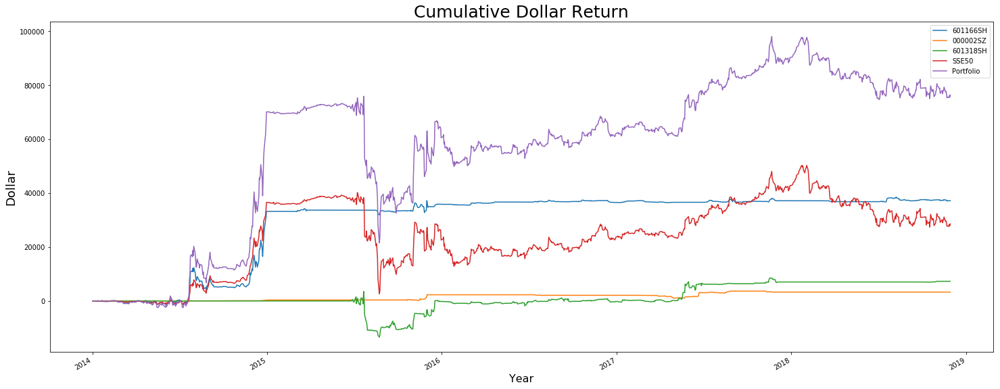

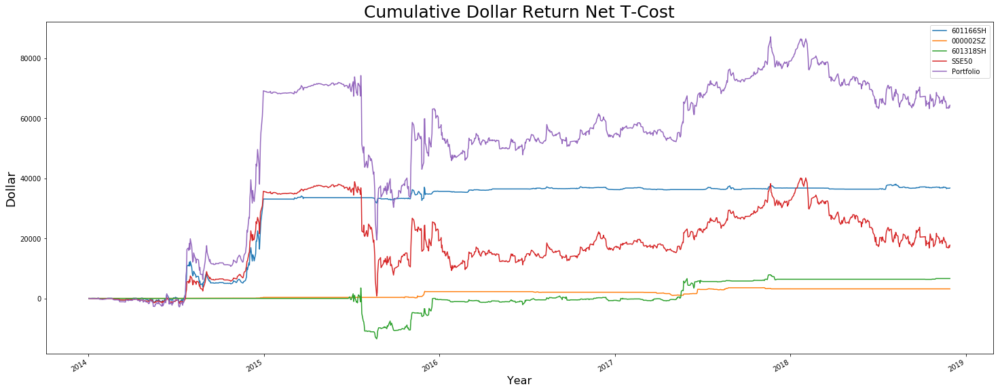

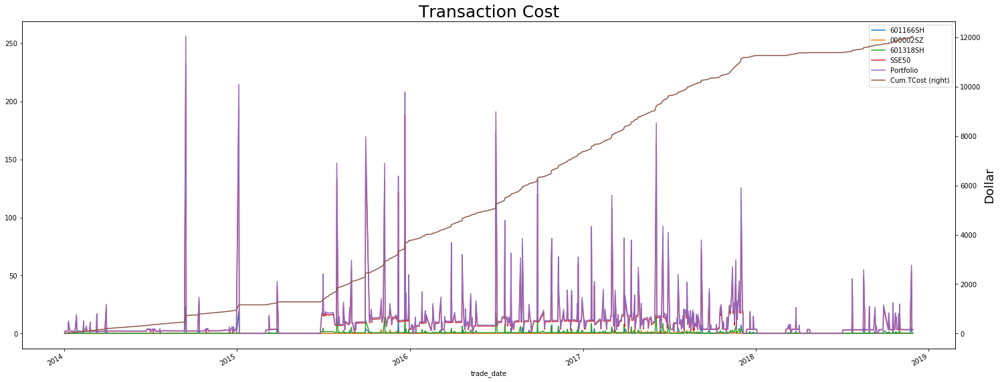

In [70]:
components = [i for i in pd.read_csv('fut_lag1_return_20_result.csv').sort_values('Linear_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 20, shortSell = False, model = 'linear')

ExtraTree:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$23.10
Total Dollar Earned before T-cost:  					$27,671.64
Average Dollar Return after T-cost per day holding position:  		$17.74
Total Dollar Earned after T-cost:  					$21,246.65
Maximum Daily Dollar Earned after T-cost:  				$4,224.35
Minimum Daily Dollar Earned after T-cost:  				$-2,815.69
Maximum Drawdown:  							-35.53%
Maximum Drawdown Period:  					 2018-02-02 - 2018-11-22


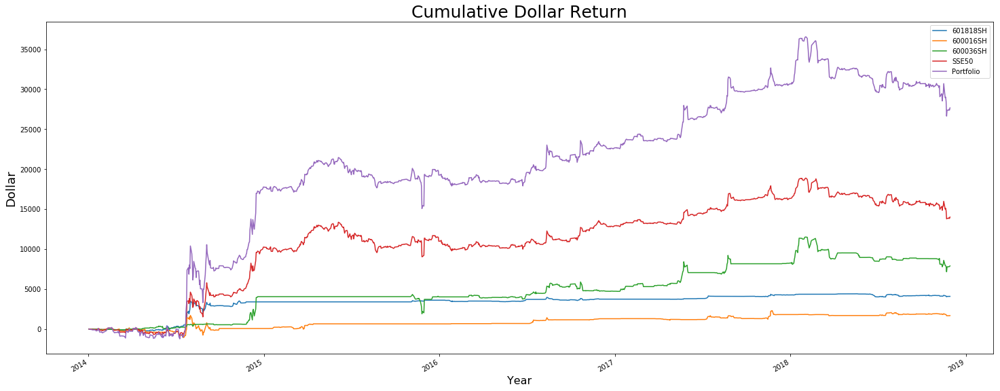

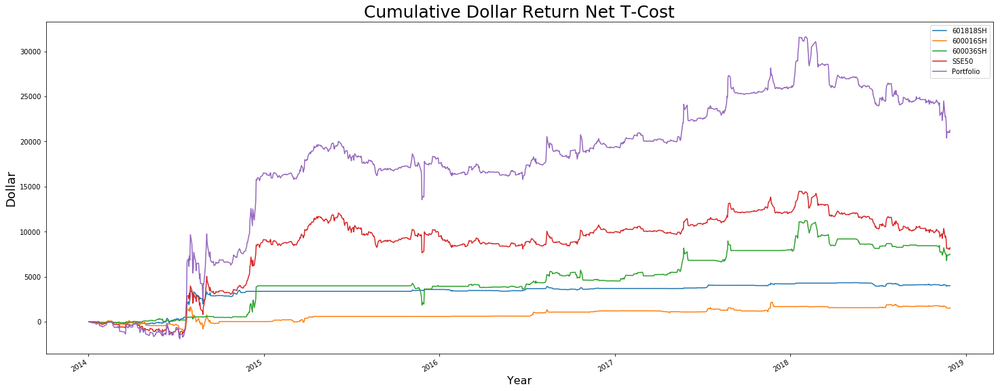

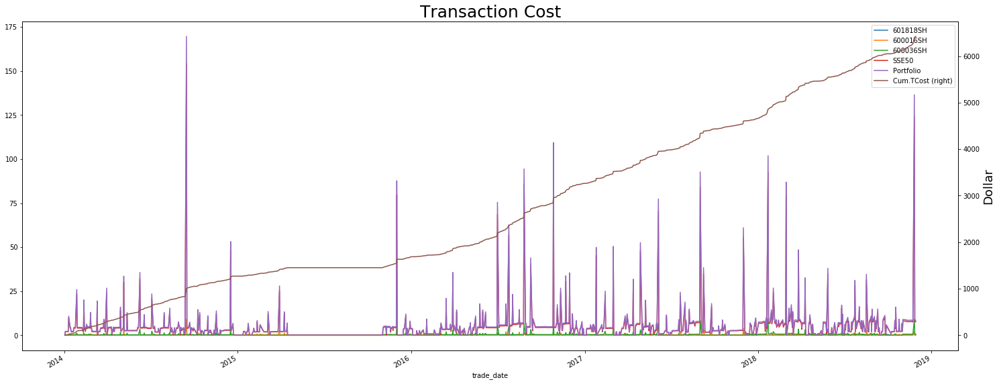

In [71]:
components = [i for i in pd.read_csv('fut_lag1_return_20_result.csv').sort_values('Tree_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 1, horizon = 20, shortSell = False, model = 'tree')

### 6.2. Assume Enter the Market at t+2

### 6.2.1. Constructing the portfolio based on the models of 1-day return prediction:

Ensemble Learning:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$-23.82
Total Dollar Earned before T-cost:  					$-20,825.42
Average Dollar Return after T-cost per day holding position:  		$-47.56
Total Dollar Earned after T-cost:  					$-43,850.44
Maximum Daily Dollar Earned after T-cost:  				$37,888.88
Minimum Daily Dollar Earned after T-cost:  				$-61,303.28
Maximum Drawdown:  							-165.39%
Maximum Drawdown Period:  					 2015-05-25 - 2015-08-24


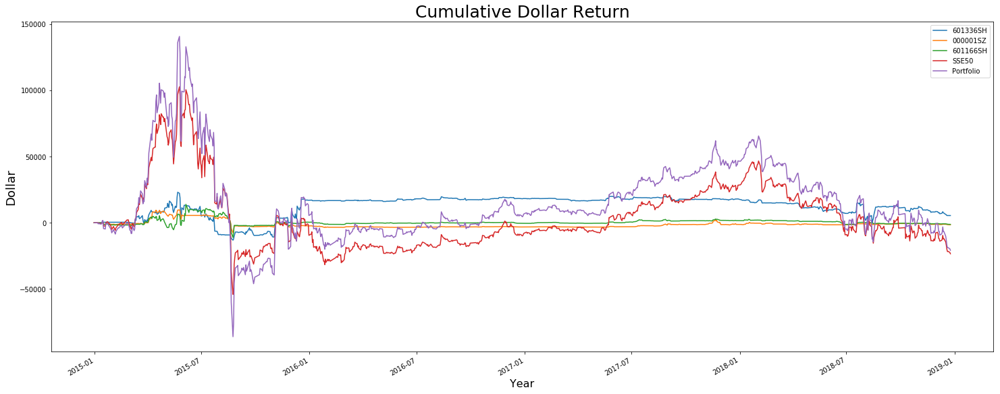

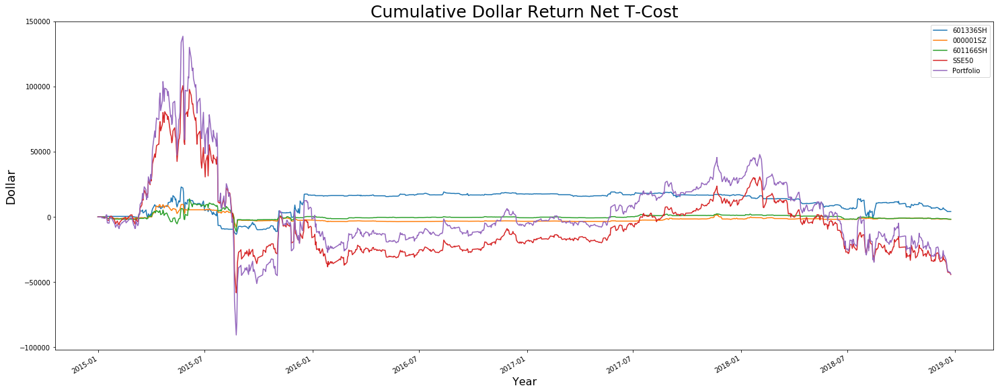

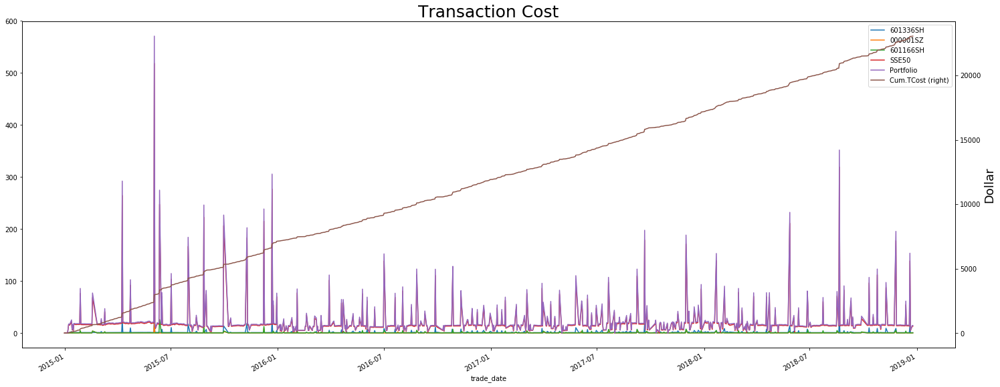

In [72]:
components = [i for i in pd.read_csv('fut_lag2_return_1_result.csv').sort_values('Ensemble_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 1, shortSell = False, model = 'ensemble')

Linear Regression:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$46.98
Total Dollar Earned before T-cost:  					$55,189.29
Average Dollar Return after T-cost per day holding position:  		$33.43
Total Dollar Earned after T-cost:  					$38,758.42
Maximum Daily Dollar Earned after T-cost:  				$23,420.46
Minimum Daily Dollar Earned after T-cost:  				$-26,250.52
Maximum Drawdown:  							-104.53%
Maximum Drawdown Period:  					 2015-05-25 - 2015-08-24


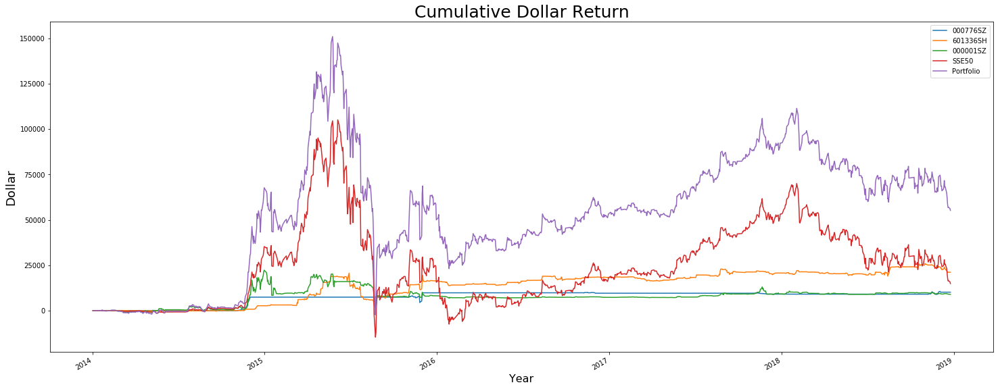

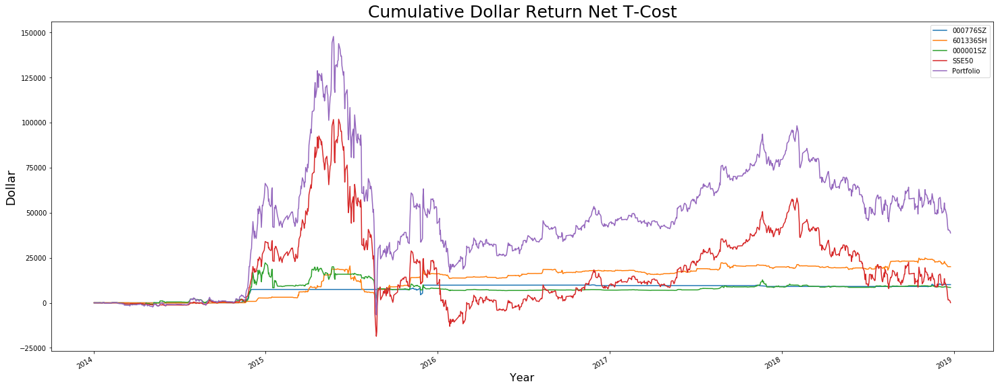

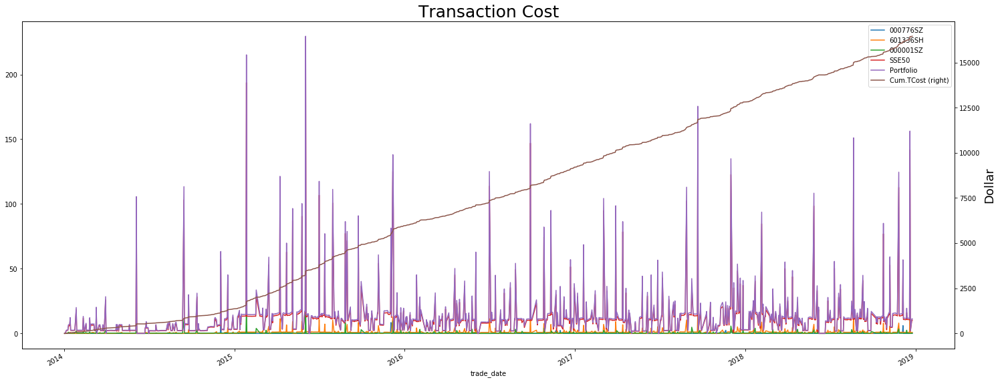

In [73]:
components = [i for i in pd.read_csv('fut_lag2_return_1_result.csv').sort_values('Linear_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 1, shortSell = False, model = 'linear')

ExtraTree:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$34.43
Total Dollar Earned before T-cost:  					$36,518.70
Average Dollar Return after T-cost per day holding position:  		$23.82
Total Dollar Earned after T-cost:  					$23,632.13
Maximum Daily Dollar Earned after T-cost:  				$11,078.76
Minimum Daily Dollar Earned after T-cost:  				$-20,834.03
Maximum Drawdown:  							-79.49%
Maximum Drawdown Period:  					 2015-05-25 - 2015-08-24


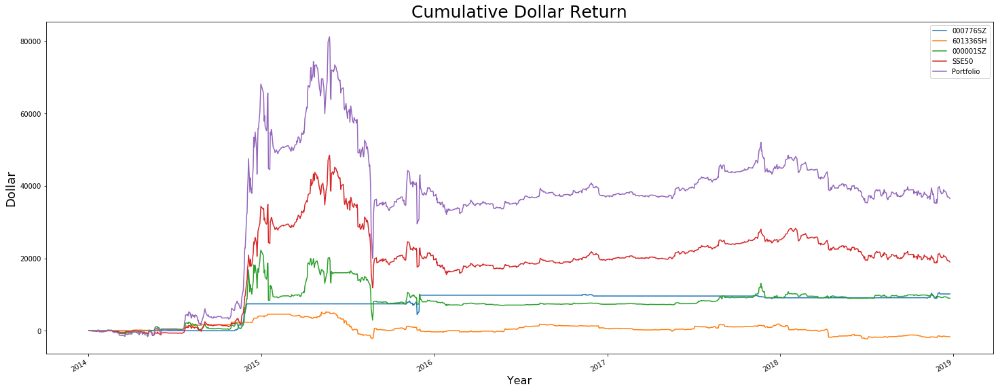

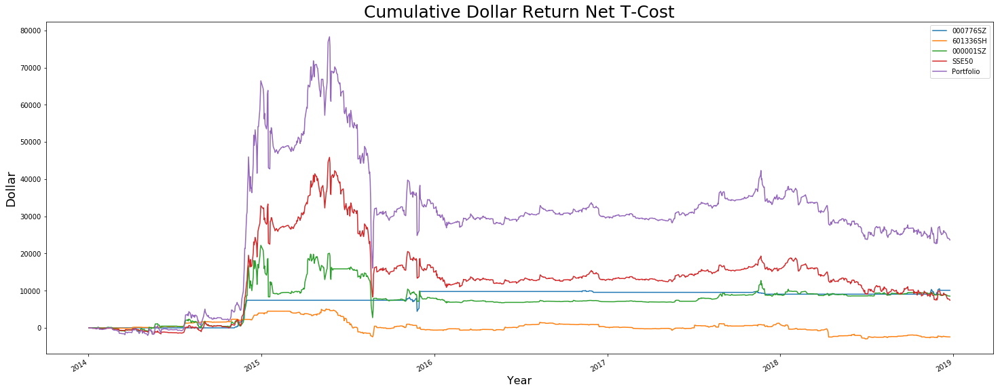

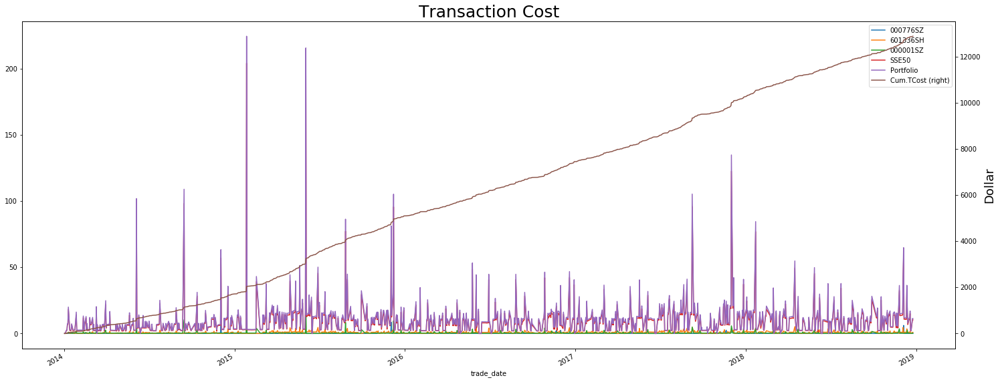

In [74]:
components = [i for i in pd.read_csv('fut_lag2_return_1_result.csv').sort_values('Tree_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 1, shortSell = False, model = 'tree')

### 6.2.2. Constructing the portfolio based on the models of 5-day return prediction:

Ensemble Learning:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$-115.66
Total Dollar Earned before T-cost:  					$15,669.10
Average Dollar Return after T-cost per day holding position:  		$-137.57
Total Dollar Earned after T-cost:  					$-5,448.22
Maximum Daily Dollar Earned after T-cost:  				$21,882.75
Minimum Daily Dollar Earned after T-cost:  				$-27,870.89
Maximum Drawdown:  							-103.01%
Maximum Drawdown Period:  					 2018-02-02 - 2018-12-19


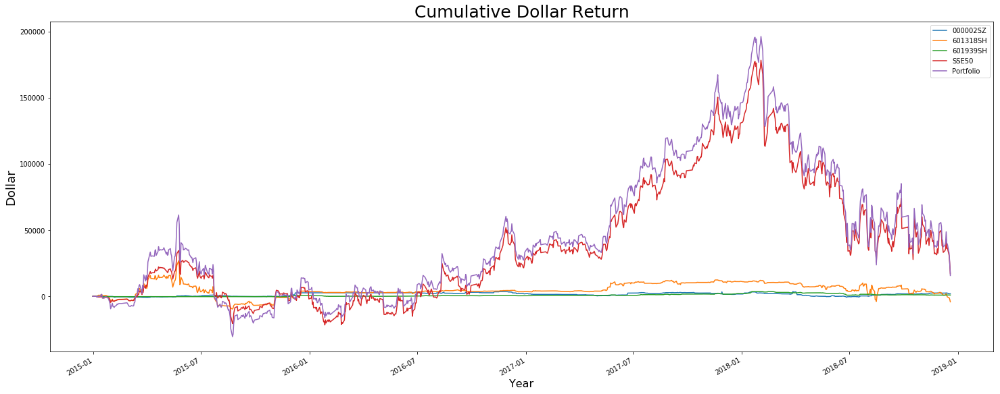

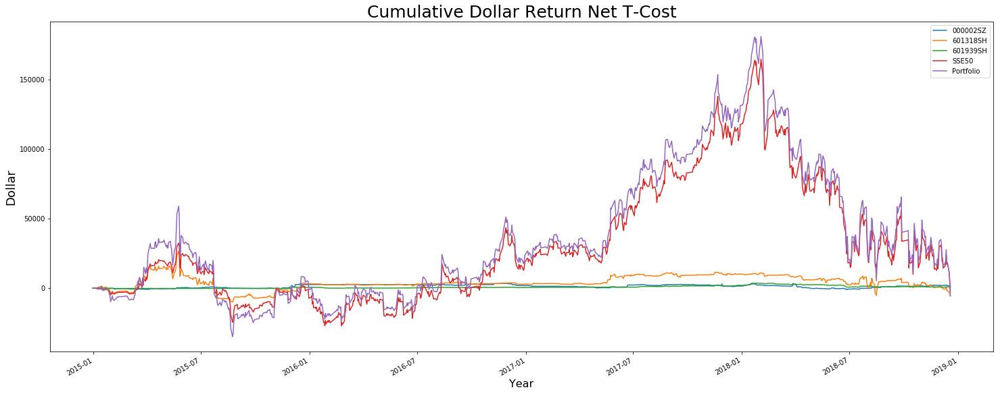

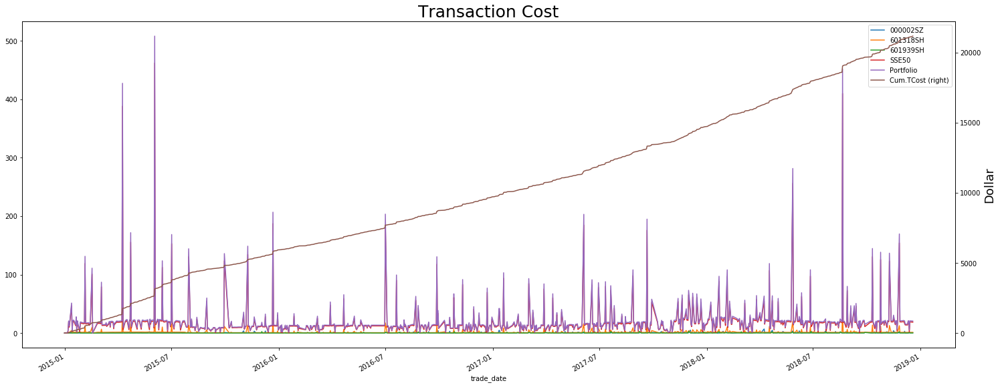

In [75]:
components = [i for i in pd.read_csv('fut_lag2_return_5_result.csv').sort_values('Ensemble_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 5, shortSell = False, model = 'ensemble')

Linear Regression:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$46.06
Total Dollar Earned before T-cost:  					$57,677.73
Average Dollar Return after T-cost per day holding position:  		$39.07
Total Dollar Earned after T-cost:  					$49,231.46
Maximum Daily Dollar Earned after T-cost:  				$11,061.85
Minimum Daily Dollar Earned after T-cost:  				$-21,198.90
Maximum Drawdown:  							-56.29%
Maximum Drawdown Period:  					 2015-01-15 - 2015-08-24


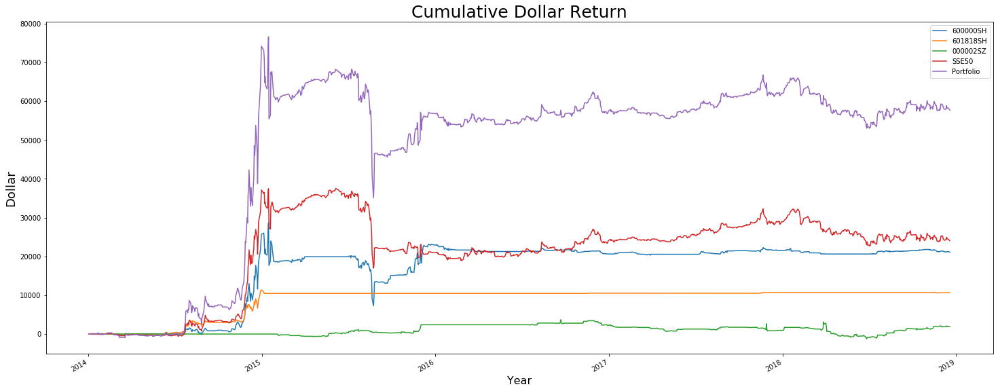

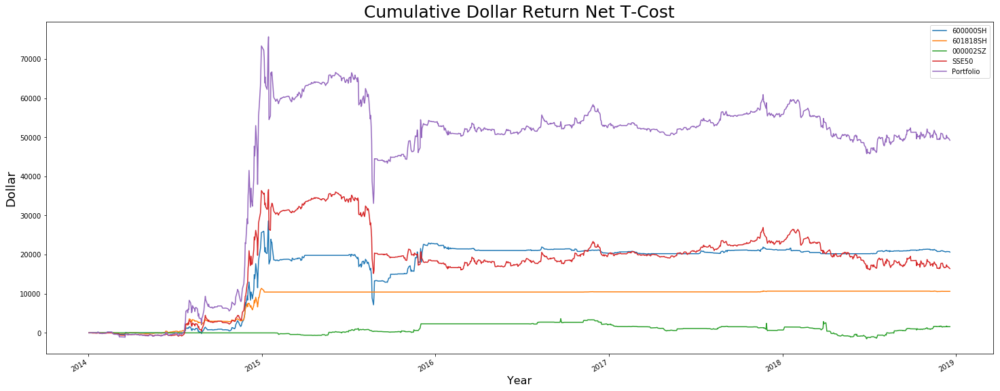

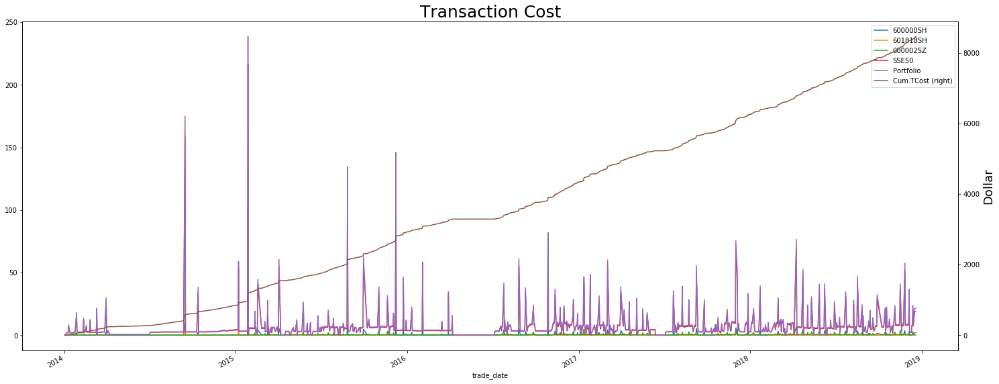

In [76]:
components = [i for i in pd.read_csv('fut_lag2_return_5_result.csv').sort_values('Linear_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 5, shortSell = False, model = 'linear')

ExtraTree:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$72.26
Total Dollar Earned before T-cost:  					$88,946.48
Average Dollar Return after T-cost per day holding position:  		$62.67
Total Dollar Earned after T-cost:  					$77,346.06
Maximum Daily Dollar Earned after T-cost:  				$16,813.01
Minimum Daily Dollar Earned after T-cost:  				$-23,079.61
Maximum Drawdown:  							-48.86%
Maximum Drawdown Period:  					 2015-01-15 - 2015-08-24


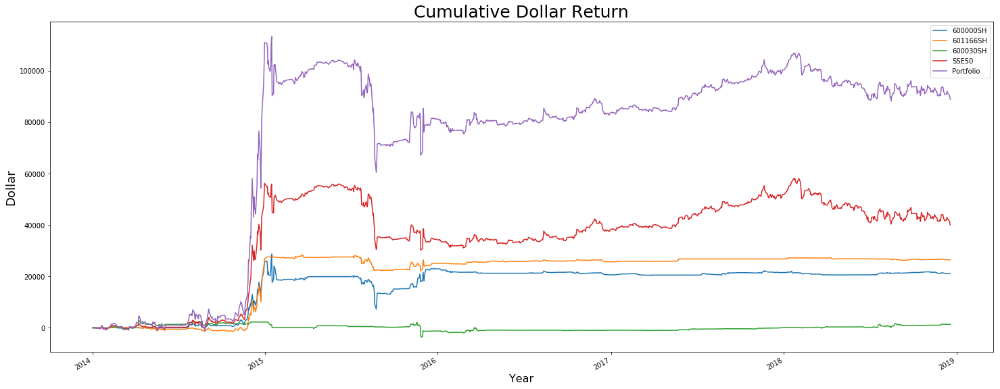

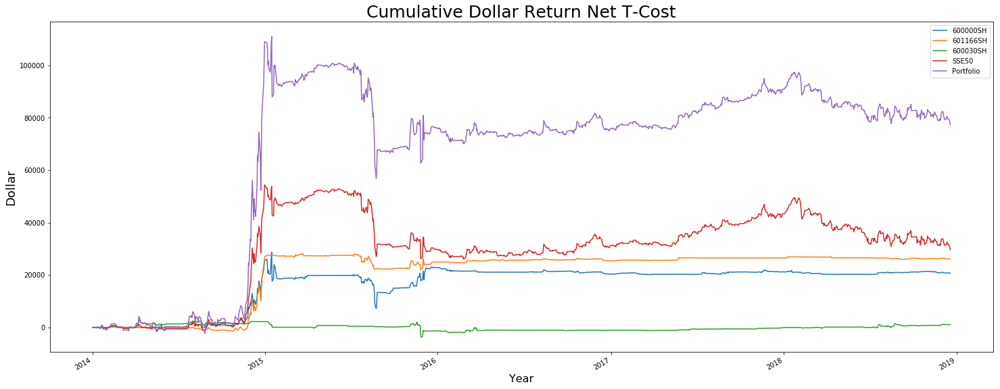

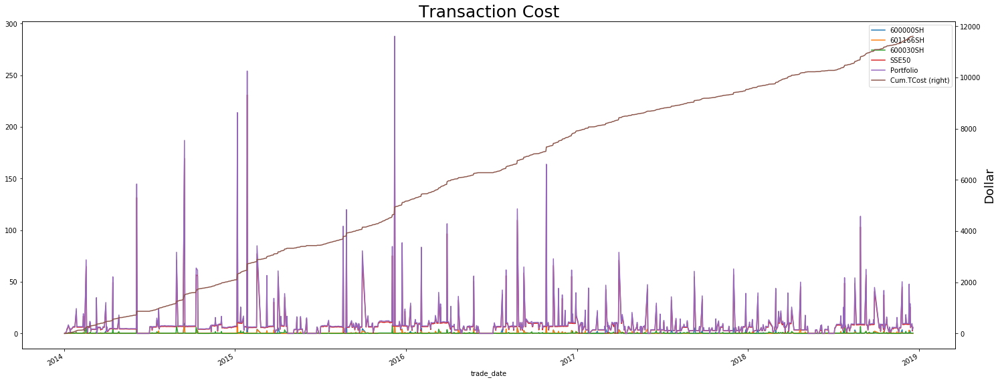

In [77]:
components = [i for i in pd.read_csv('fut_lag2_return_5_result.csv').sort_values('Tree_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 5, shortSell = False, model = 'tree')

### 6.2.3. Constructing the portfolio based on the models of 10-day return prediction:

Ensemble Learning:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$-75.07
Total Dollar Earned before T-cost:  					$54,271.96
Average Dollar Return after T-cost per day holding position:  		$-105.92
Total Dollar Earned after T-cost:  					$24,663.04
Maximum Daily Dollar Earned after T-cost:  				$27,495.13
Minimum Daily Dollar Earned after T-cost:  				$-39,874.09
Maximum Drawdown:  							-101.45%
Maximum Drawdown Period:  					 2018-02-02 - 2018-08-16


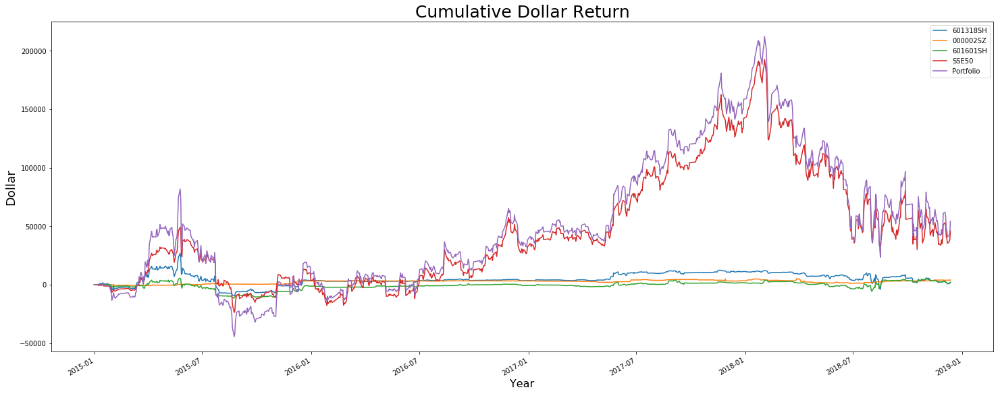

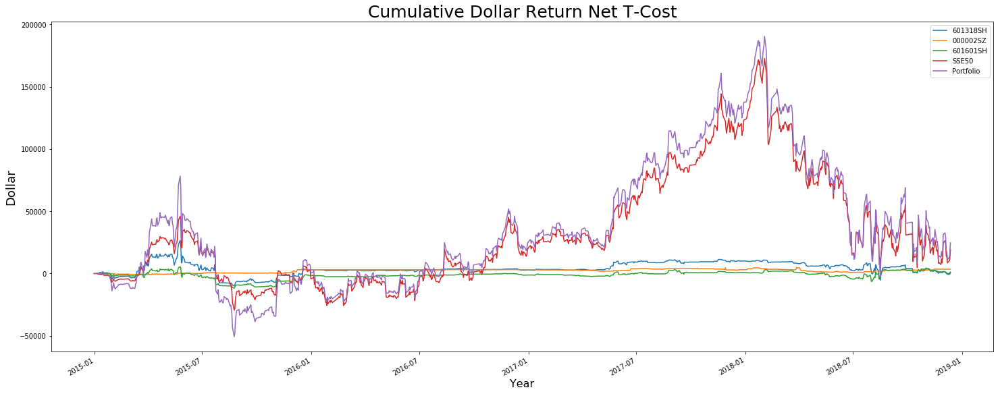

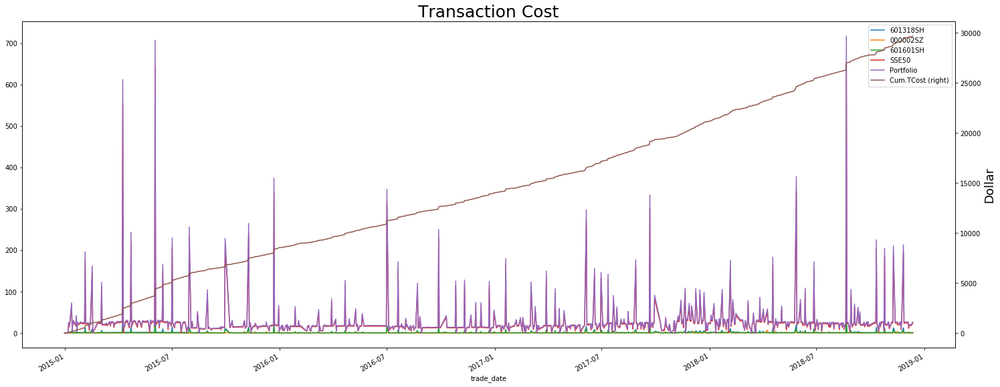

In [78]:
components = [i for i in pd.read_csv('fut_lag2_return_10_result.csv').sort_values('Ensemble_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 10, shortSell = False, model = 'ensemble')

Linear Regression:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$80.65
Total Dollar Earned before T-cost:  					$96,036.02
Average Dollar Return after T-cost per day holding position:  		$73.53
Total Dollar Earned after T-cost:  					$87,451.32
Maximum Daily Dollar Earned after T-cost:  				$12,877.91
Minimum Daily Dollar Earned after T-cost:  				$-13,951.21
Maximum Drawdown:  							-21.42%
Maximum Drawdown Period:  					 2014-12-19 - 2014-12-23


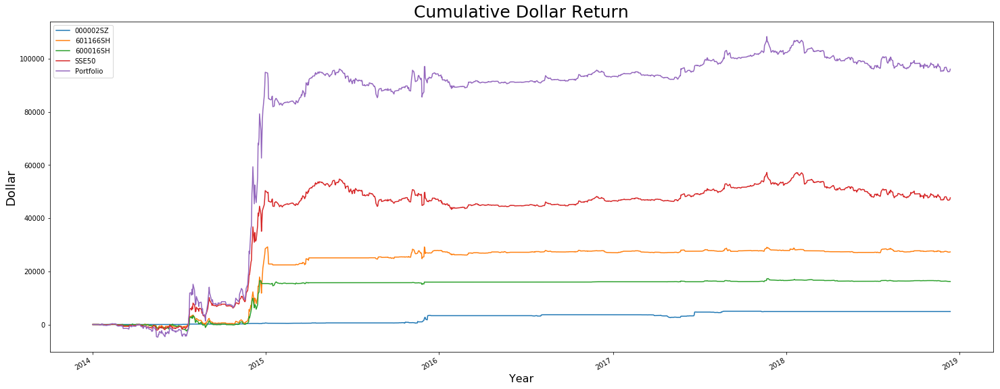

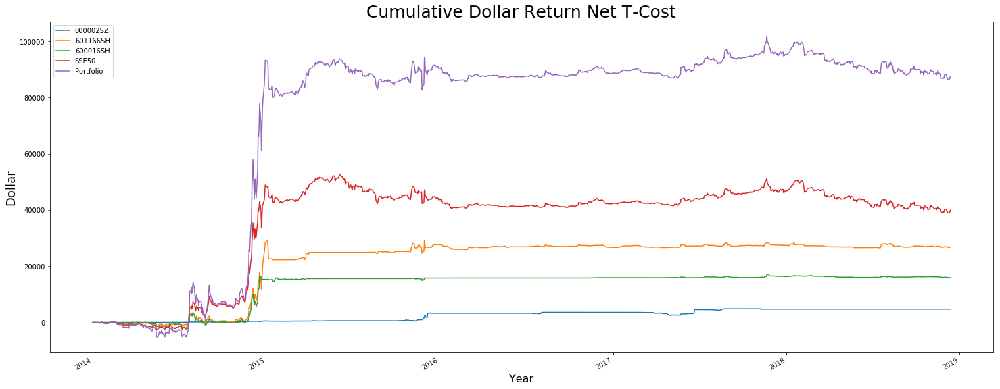

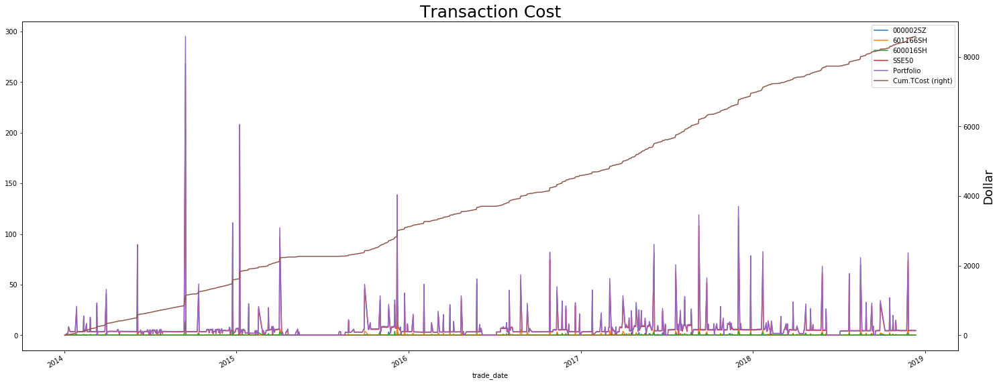

In [79]:
components = [i for i in pd.read_csv('fut_lag2_return_10_result.csv').sort_values('Linear_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 10, shortSell = False, model = 'linear')

ExtraTree:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$94.60
Total Dollar Earned before T-cost:  					$112,668.07
Average Dollar Return after T-cost per day holding position:  		$87.92
Total Dollar Earned after T-cost:  					$104,646.78
Maximum Daily Dollar Earned after T-cost:  				$13,673.67
Minimum Daily Dollar Earned after T-cost:  				$-16,619.78
Maximum Drawdown:  							-28.34%
Maximum Drawdown Period:  					 2015-04-07 - 2015-08-24


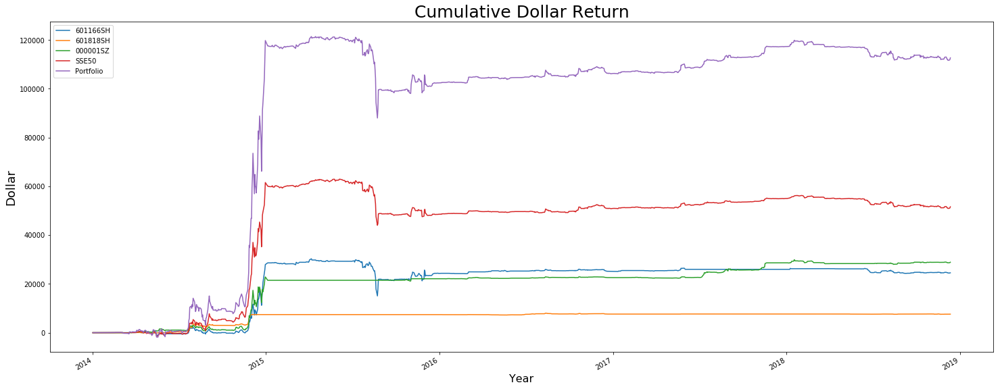

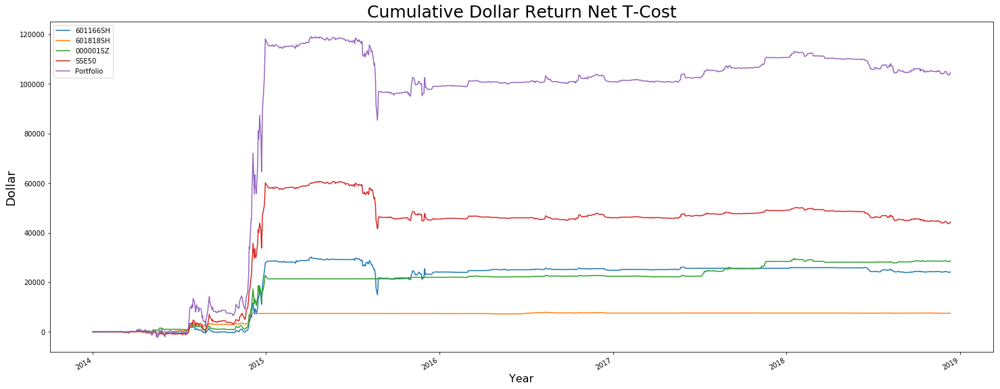

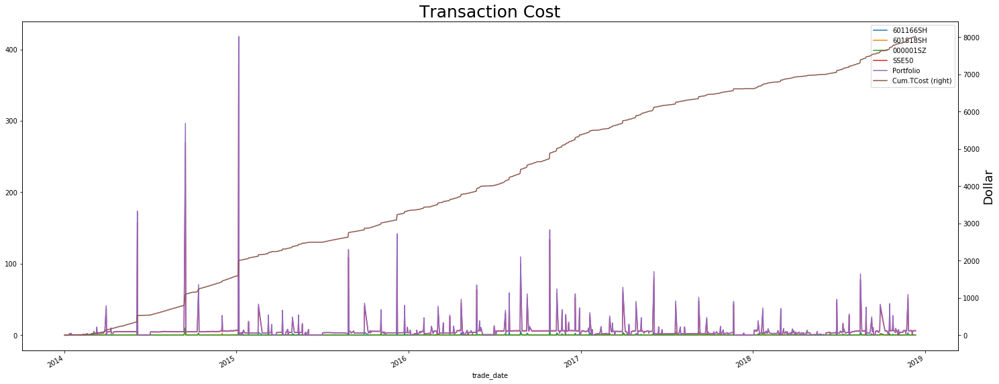

In [80]:
components = [i for i in pd.read_csv('fut_lag2_return_10_result.csv').sort_values('Tree_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 10, shortSell = False, model = 'tree')

### 6.2.4. Constructing the portfolio based on the models of 20-day return prediction:

Ensemble Learning:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$1.46
Total Dollar Earned before T-cost:  					$996.80
Average Dollar Return after T-cost per day holding position:  		$-27.14
Total Dollar Earned after T-cost:  					$-26,222.75
Maximum Daily Dollar Earned after T-cost:  				$18,474.78
Minimum Daily Dollar Earned after T-cost:  				$-28,343.90
Maximum Drawdown:  							-162.87%
Maximum Drawdown Period:  					 2015-05-25 - 2018-08-16


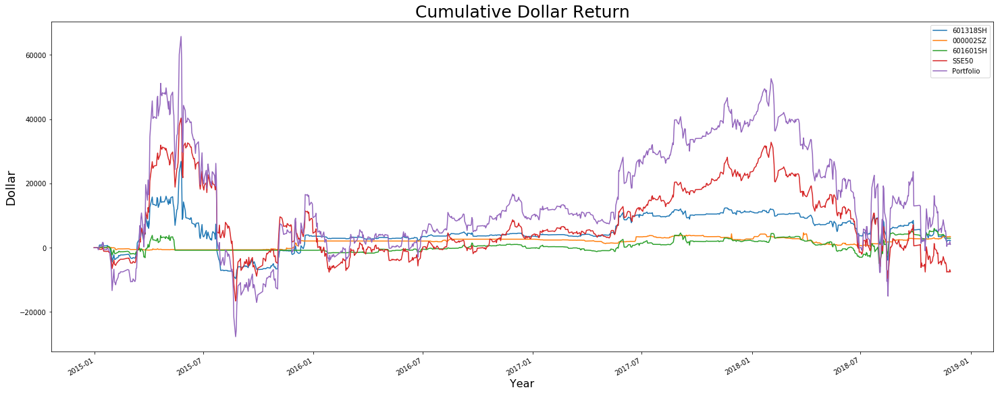

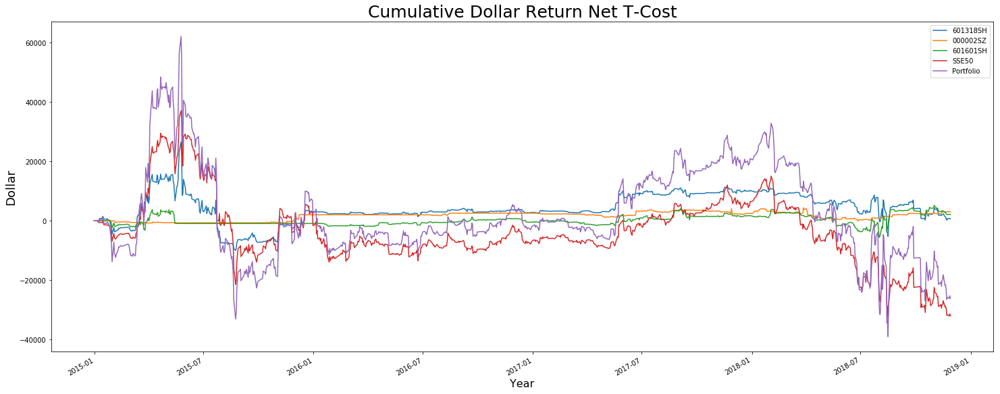

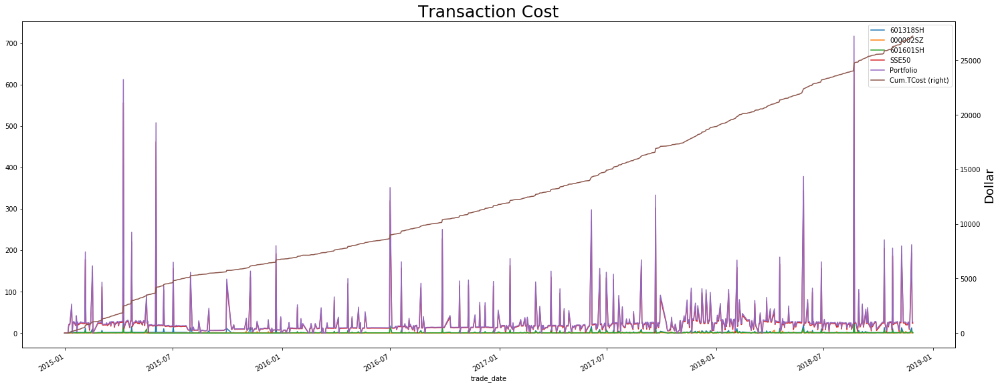

In [81]:
components = [i for i in pd.read_csv('fut_lag2_return_20_result.csv').sort_values('Ensemble_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 20, shortSell = False, model = 'ensemble')

Linear Regression:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$83.75
Total Dollar Earned before T-cost:  					$98,796.67
Average Dollar Return after T-cost per day holding position:  		$77.58
Total Dollar Earned after T-cost:  					$91,424.34
Maximum Daily Dollar Earned after T-cost:  				$11,957.13
Minimum Daily Dollar Earned after T-cost:  				$-8,468.50
Maximum Drawdown:  							-14.14%
Maximum Drawdown Period:  					 2017-11-21 - 2018-11-22


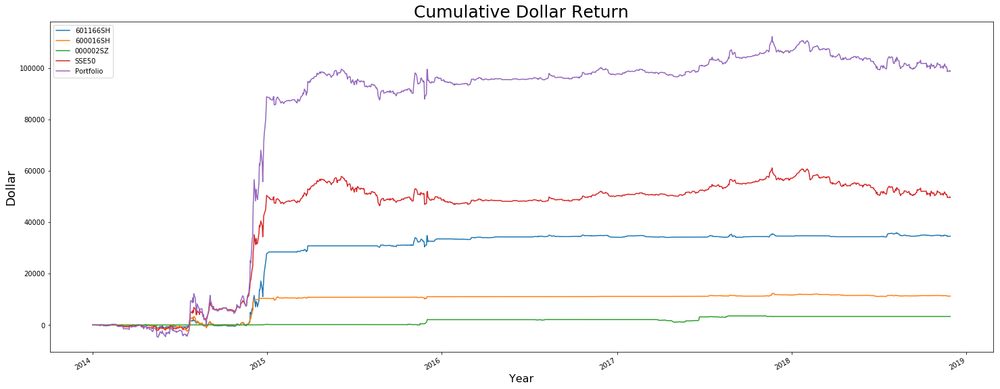

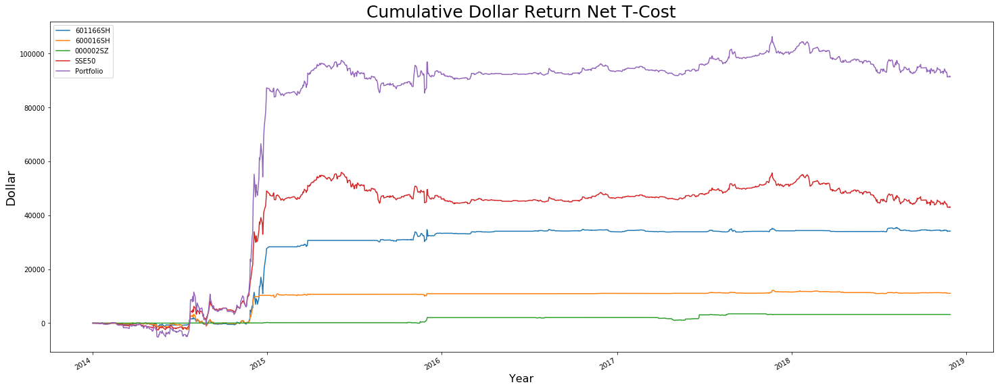

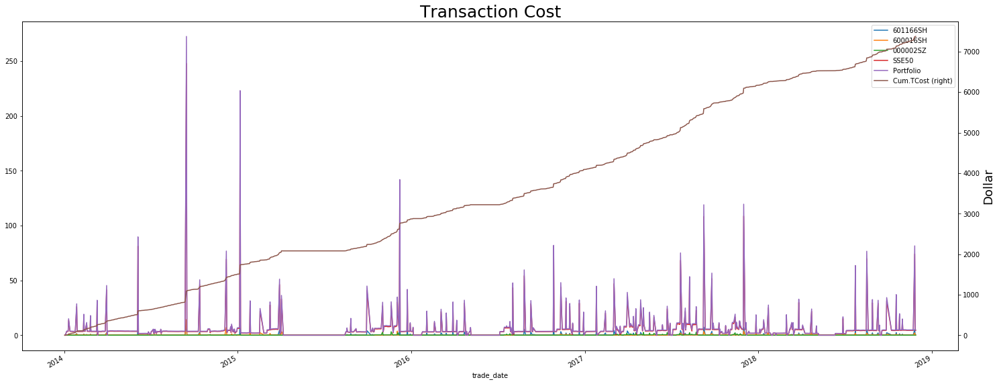

In [82]:
components = [i for i in pd.read_csv('fut_lag2_return_20_result.csv').sort_values('Linear_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 20, shortSell = False, model = 'linear')

ExtraTree:

************************************************************************************
**************************  Statistics of the Portfolio  ***************************
************************************************************************************
Average Dollar Earned before T-cost per day holding position:  		$11.73
Total Dollar Earned before T-cost:  					$14,122.92
Average Dollar Return after T-cost per day holding position:  		$7.22
Total Dollar Earned after T-cost:  					$8,725.33
Maximum Daily Dollar Earned after T-cost:  				$2,446.81
Minimum Daily Dollar Earned after T-cost:  				$-2,376.52
Maximum Drawdown:  							-80.43%
Maximum Drawdown Period:  					 2015-06-05 - 2016-01-27


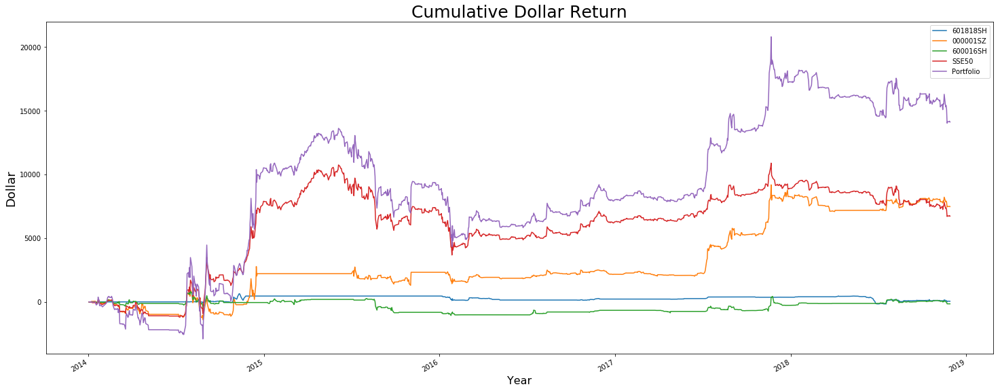

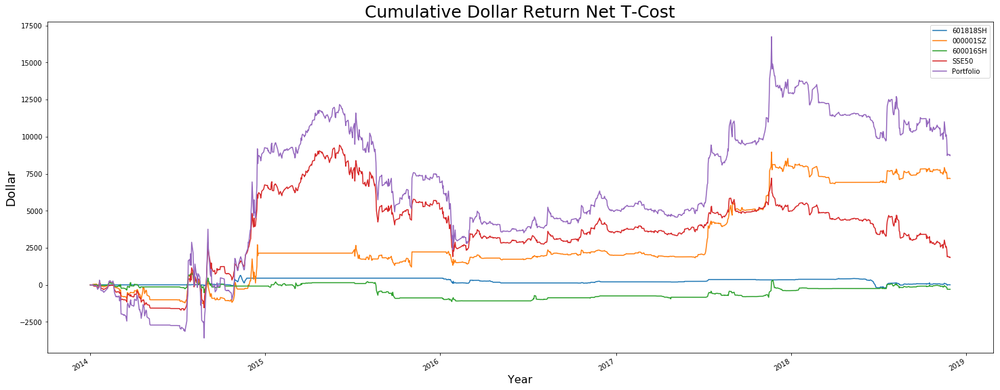

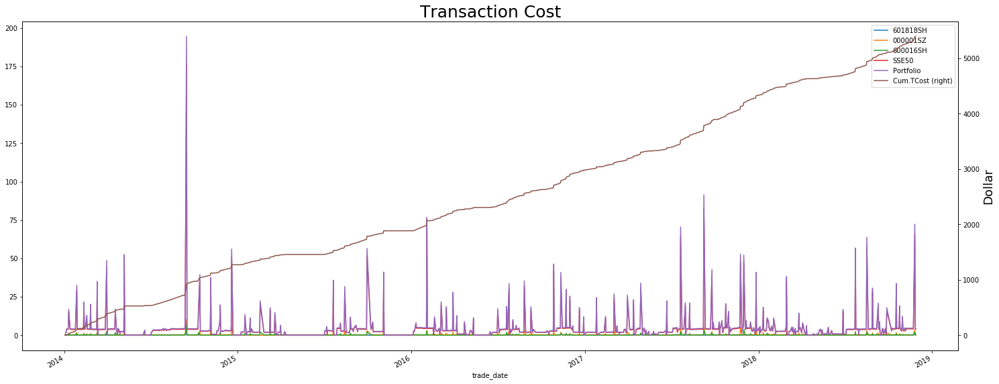

In [83]:
components = [i for i in pd.read_csv('fut_lag2_return_20_result.csv').sort_values('Tree_directional_accuracy', ascending = False).head(3).stock]
port_dollar_neutral_bactest(components, lag = 2, horizon = 20, shortSell = False, model = 'tree')

I am very surprised to have these results. It seems that most portfolios can generate non-trivial positive returns over four years horizon. However, two things draw my attention: 

1. Most of the returns are generated between 2014 and 2016. Little has the cumulative dollar returns grow from 2016 onwards.

2. Strangely, for most portfolios, our positive returns mainly come from shorting the index but not longing the stocks.

Since I am not able to answer these two questions at this moment, I suggest that we should be cautious about the backtest results and further investigation is needed to ensure the robustness of our model.

## 7. Some reflections:

### 7.1. Web-crawling company-specific news may be better

Instead of Xiwenlianbo, it is also suggested that to find those company-specific feeds online. These pieces news should be most relevant to the company concerned and the sentiment analysis should be less tricky than analysing Xinwenlianbo.

However, the reason I do not do this in the first place is I find most reliable news sources such as China Securities Journal and Shanghai Securities News have implemented anti-crawler mechanisms by either blocking the access or mixing random noise into the data that I have not overcome this problem.

### 7.2. Neural Network?

Many machine learning researchers specialised in the text data apply very fancy neural network algorithm for deep learning. Many of them get pretty decent results. I do think it is interesting because I find text data is not likely to have a linear relationship with the future return. Neural network may help. 

However, in addition to the technical constraint, the model risk of deep learning algorithms is very high. An deep learning expert may be able to explain how the network works, but he may not be able to explain the economic intuition behind the model. In this case, even though we may have a good model in backtesting, we may not be able to trust it when it is most needed.

## 8. Conclusion and Future work

Predicting the FTSE China A50 Index components by incorporating the text data of Xinwenlianbo (新闻联播) alongside with other common technical features such as rolling means and volatility is more difficult to it may seem. Most, if not all, of the features generated by the relevant text are discarded during the feature selection process. It shows that the these features have little correlations with the future returns in an observation window of 1, 5, 10, and 20 trading days, respectively. While I am confident that the Chinese NLP of the text is of high quality, the usefulness of Xinwenlianbo text data is questionable.


Moreover, based on the features selected for each stock, I perform simple linear regression, extra trees, and an ensemble learning technique by combining the predictions made by the previous 2 base models to predict the directions of future returns of each stock. Although the prediction power of the models is merely above random guessing, a simply long-short dollar-neutral strategy may still be able to generate positive returns.

For further research, I suggest using company-specific news instead of Xinwenlianbo if one would like to apply Chinese NLP to predict stock returns. In this case, the text data will be more relevant to the company and the features generated from the text data might be less likely to be discarded during the feature selection process.